# Lab 03 — Edge Detection Techniques and Their Impact on Classification Performance

**Dataset:** the same 4-class ISIC skin-lesion subset used in Lab 01 and Lab 02 (`melanoma`, `nevus`,
`pigmented benign keratosis`, `basal cell carcinoma`) with the **identical 80/20 train/validation split (seed 42)**
and the official test folder — so every number here is directly comparable with Labs 01–02.

## 0. Environment setup

In [2]:
!pip install -q tabulate kagglehub
import subprocess, torch
print(subprocess.run(["nvidia-smi", "--query-gpu=name,memory.total", "--format=csv,noheader"],
                     capture_output=True, text=True).stdout)
print("PyTorch:", torch.__version__, "| CUDA available:", torch.cuda.is_available())

Tesla T4, 15360 MiB

PyTorch: 2.11.0+cu128 | CUDA available: True


In [3]:
import os, gc, json, math, time, random, copy, warnings, shutil
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from concurrent.futures import ThreadPoolExecutor
from IPython.display import display
from skimage.feature import hog
from skimage.morphology import skeletonize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, confusion_matrix)

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")

# ---------------- Reproducibility ----------------
SEED = 42
def set_seed(seed=SEED):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
set_seed()

# =====================================================================================
#                                   CONFIGURATION
# =====================================================================================
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE     = 224
NUM_CLASSES  = 4

# ---- Tasks 1-3 (edge / noise study) ----
GAUSS_NOISE_SIGMA    = 25      # std-dev of the additive Gaussian noise (0-255 scale)
SP_AMOUNT            = 0.05    # fraction of pixels corrupted by salt-and-pepper noise
N_PER_CLASS_ANALYSIS = 4       # images per class used for the Table 1 / Table 2 statistics (16 total)

# ---- Task 4: which representation is "Set B" and "Set C" ----
LAB2_BEST_FILTER     = "Sharpening"   # best filter of Lab 2 (ResNet50 + Sharpening: 71.88 % acc, 66.17 macro-F1)
EDGE_METHOD_OVERRIDE = None           # None = choose automatically in Task 3; or force e.g. "Canny", "Sobel", "LoG"
CANNY_OVERRIDE       = None           # None = automatic; or force e.g. dict(low=50, high=150, ksize=3)

# ---- Task 5: models. Same training recipe for ALL runs (only the input representation changes) ----
CNN_MODELS    = {"CNN Model 1": "ResNet50", "CNN Model 2": "AlexNet"}   # top-2 models of Lab 1
SEEDS         = [42]          # use [42, 43, 44] for mean +- std over 3 runs (takes ~3x longer)
BATCH_SIZE    = 64
EPOCHS        = 12            # identical number of epochs for every CNN run (no early stopping)
WARMUP_EPOCHS = 1
LR_BACKBONE   = 1e-4
LR_HEAD       = 1e-3
WEIGHT_DECAY  = 1e-4
LABEL_SMOOTH  = 0.05
DROPOUT       = 0.3
LAB1_REPORTED_ACC = {"ResNet50": 78.12, "AlexNet": 75.00}   # Lab 1 test accuracies, shown for reference only

REPS = ["Raw", "Filtered", "Edge"]      # Set A, Set B, Set C

RESULT_DIR  = "/content/lab3_results"
os.makedirs(RESULT_DIR, exist_ok=True)
RESULT_JSON = f"{RESULT_DIR}/classification_results.json"

# T4 speed switches
torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
print("Device:", DEVICE)

Device: cuda


## 1. Dataset preparation

Identical to Lab 02: same Kaggle source, same 4 classes, same `randperm(seed 42)` 80/20 split, same test folder.

In [4]:
import kagglehub
path = kagglehub.dataset_download("nodoubttome/skin-cancer9-classesisic")

dataset_root = os.path.join(path, "Skin cancer ISIC The International Skin Imaging Collaboration")
train_dir = os.path.join(dataset_root, "Train")
test_dir  = os.path.join(dataset_root, "Test")

SELECTED_CLASSES = sorted(["melanoma", "nevus", "pigmented benign keratosis", "basal cell carcinoma"])
CLASS_NAMES  = SELECTED_CLASSES
SHORT_NAMES  = ["BCC", "MEL", "NV", "PBK"]   # basal cell carcinoma, melanoma, nevus, pigmented benign keratosis
print("Classes:", CLASS_NAMES)

def build_file_list(root):
    files, labels = [], []
    for ci, cname in enumerate(SELECTED_CLASSES):
        cdir = os.path.join(root, cname)
        for fn in sorted(os.listdir(cdir)):
            fp = os.path.join(cdir, fn)
            if os.path.isfile(fp):
                files.append(fp); labels.append(ci)
    return files, np.array(labels, dtype=np.int64)

trainval_files, trainval_labels = build_file_list(train_dir)
test_files,     test_labels     = build_file_list(test_dir)

# ---- identical split to Labs 1-2 ----
g = torch.Generator().manual_seed(SEED)
perm = torch.randperm(len(trainval_files), generator=g).tolist()
n_train = int(0.8 * len(perm))
train_idx = np.array(perm[:n_train]); val_idx = np.array(perm[n_train:])

y_train_np = trainval_labels[train_idx]
y_val_np   = trainval_labels[val_idx]
y_test_np  = test_labels
print(f"Train: {len(train_idx)} | Val: {len(val_idx)} | Test: {len(test_files)}")
if (len(train_idx), len(val_idx), len(test_files)) != (1306, 327, 64):
    print("WARNING: split sizes differ from Labs 1-2 (1306 / 327 / 64) - check the dataset and class list.")

dist_df = pd.DataFrame([{"Class": c,
                         "Train": int((y_train_np == ci).sum()),
                         "Val":   int((y_val_np   == ci).sum()),
                         "Test":  int((y_test_np  == ci).sum())} for ci, c in enumerate(SELECTED_CLASSES)])
dist_df["Total"] = dist_df[["Train", "Val", "Test"]].sum(axis=1)
display(dist_df)

100%|██████████| 786M/786M [00:39<00:00, 21.1MB/s]

Extracting files...


Classes: ['basal cell carcinoma', 'melanoma', 'nevus', 'pigmented benign keratosis']
Train: 1306 | Val: 327 | Test: 64


,Class,Train,Val,Test,Total
0,basal cell carcinoma,293,83,16,392
1,melanoma,351,87,16,454
2,nevus,288,69,16,373
3,pigmented benign keratosis,374,88,16,478


### 1.1 Decode + resize **once** and cache in RAM
Everything below (edge maps, filters, GPU tensors) is derived from this `uint8` cache.

In [5]:
def load_and_resize(fp):
    img = cv2.imread(fp, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

def load_all(files):
    with ThreadPoolExecutor(max_workers=8) as ex:
        imgs = list(ex.map(load_and_resize, files))
    return np.stack(imgs).astype(np.uint8)

t0 = time.time()
RAW_TRAINVAL = load_all(trainval_files)     # [N,224,224,3] uint8, train+val (val_idx / train_idx index into it)
RAW_TEST     = load_all(test_files)
print(f"Decoded in {time.time()-t0:.1f}s | train+val cache {RAW_TRAINVAL.shape} | test cache {RAW_TEST.shape}")

Decoded in 19.7s | train+val cache (1633, 224, 224, 3) | test cache (64, 224, 224, 3)


## 2. Toolbox: edge detectors, noise, filters and edge-quality metrics

All detectors work on the **grayscale** 224x224 image.

| Detector | Implementation | Note |
|---|---|---|
| Sobel Gx / Gy / magnitude | `cv2.Sobel`, 3x3 | first order, built-in 3-pixel smoothing |
| Prewitt | 3x3 Prewitt kernels via `cv2.filter2D` | first order, unweighted smoothing |
| Laplacian | `cv2.Laplacian`, 3x3, absolute value | second order, no smoothing |
| LoG | Gaussian (sigma = 1.5) then Laplacian | second order with smoothing |
| Canny | Gaussian blur (k x k) -> `cv2.Canny` (L2 gradient, non-max suppression, hysteresis) | **OpenCV's `Canny` has no internal blur**, so the smoothing step of the classical algorithm is done explicitly (`ksize`) |

**Measuring "edge quality" objectively.** Every edge map is binarised (Canny is already binary; the other detectors use
Otsu on the normalised response) and compared with the edge map the *same detector* produces on the **clean** image,
with a 1-pixel tolerance:

* **Precision** = share of detected edge pixels that also exist on the clean image (1 - precision = *false edges*)
* **Recall** = share of clean edge pixels that are still found (1 - recall = *missing / broken edges*)
* **F1 vs clean** = harmonic mean -> used for *Edge Quality* and *Noise Sensitivity* (noise sensitivity = 1 - F1)
* **Fragments / 1000 edge px** = connected components per 1000 edge pixels (high = broken, discontinuous edges)
* **Edge width** = edge pixels / skeleton pixels (1 = perfectly thin, large = thick / blurred edges = poor sharpness)

In [6]:
# ---------------- Edge detectors (uint8 GRAY input) ----------------
PREWITT_X = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
PREWITT_Y = PREWITT_X.T.copy()
LOG_SIGMA = 1.5
CANNY_DEFAULT = dict(low=50, high=150, ksize=3)

def to_gray(img_rgb):
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

def sobel_gx(g):  return cv2.Sobel(g, cv2.CV_32F, 1, 0, ksize=3)
def sobel_gy(g):  return cv2.Sobel(g, cv2.CV_32F, 0, 1, ksize=3)
def sobel_mag(g): return cv2.magnitude(sobel_gx(g), sobel_gy(g))

def prewitt_mag(g):
    gf = g.astype(np.float32)
    return cv2.magnitude(cv2.filter2D(gf, cv2.CV_32F, PREWITT_X), cv2.filter2D(gf, cv2.CV_32F, PREWITT_Y))

def laplacian_abs(g):
    return np.abs(cv2.Laplacian(g, cv2.CV_32F, ksize=3))

def log_abs(g, sigma=LOG_SIGMA):
    smooth = cv2.GaussianBlur(g.astype(np.float32), (0, 0), sigmaX=sigma)
    return np.abs(cv2.Laplacian(smooth, cv2.CV_32F, ksize=3))

def canny_edges(g, low=50, high=150, ksize=3):
    """Gaussian smoothing (ksize x ksize; 0 = off) + OpenCV Canny. Returns uint8 {0,255}."""
    if ksize and ksize > 0:
        g = cv2.GaussianBlur(g, (ksize, ksize), 0)
    return cv2.Canny(g, low, high, apertureSize=3, L2gradient=True)

DETECTORS = ["Sobel", "Prewitt", "Laplacian", "LoG", "Canny"]

def edge_response(g, method, **kw):
    """Continuous response (float32). For Canny: the binary map as 0/255 float."""
    if method == "Sobel":     return sobel_mag(g)
    if method == "Prewitt":   return prewitt_mag(g)
    if method == "Laplacian": return laplacian_abs(g)
    if method == "LoG":       return log_abs(g, kw.get("sigma", LOG_SIGMA))
    if method == "Canny":
        p = {**CANNY_DEFAULT, **{k: v for k, v in kw.items() if k in ("low", "high", "ksize")}}
        return canny_edges(g, **p).astype(np.float32)
    raise ValueError(method)

def _norm8(resp, pct=99.5):
    hi = np.percentile(resp, pct)
    if hi < 1e-6: return np.zeros(resp.shape, np.uint8)
    return (np.clip(resp / hi, 0, 1) * 255).astype(np.uint8)

def edge_display(g, method, **kw):
    """uint8 picture, white edges on black. Canny stays binary; the others are normalised to the 99.5th percentile."""
    r = edge_response(g, method, **kw)
    return r.astype(np.uint8) if method == "Canny" else _norm8(r)

def edge_binary(g, method, **kw):
    """Boolean edge map (Canny already binary; other detectors: Otsu threshold on the normalised response)."""
    if method == "Canny":
        return edge_response(g, method, **kw) > 0
    _, b = cv2.threshold(_norm8(edge_response(g, method, **kw)), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return b > 0

# ---------------- Noise + the Lab-2 filters ----------------
def add_gaussian_noise(img, rng, sigma=GAUSS_NOISE_SIGMA):
    n = rng.normal(0.0, sigma, img.shape).astype(np.float32)
    return np.clip(img.astype(np.float32) + n, 0, 255).astype(np.uint8)

def add_salt_pepper(img, rng, amount=SP_AMOUNT):
    out = img.copy(); u = rng.random(img.shape[:2])
    out[u < amount / 2] = 0
    out[(u >= amount / 2) & (u < amount)] = 255
    return out

SHARPEN_KERNEL = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
def f_none(img):     return img
def f_average(img):  return cv2.blur(img, (3, 3))
def f_gaussian(img): return cv2.GaussianBlur(img, (5, 5), sigmaX=1.0)     # identical to Lab 2
def f_median(img):   return cv2.medianBlur(img, 3)                        # identical to Lab 2
def f_sharpen(img):  return cv2.filter2D(img, -1, SHARPEN_KERNEL)         # identical to Lab 2
def f_sobel_lab2(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mag = cv2.magnitude(sobel_gx(gray), sobel_gy(gray))
    mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return np.repeat(mag[:, :, None], 3, axis=2)

FILTER_FNS = {"No Filter": f_none, "Average": f_average, "Gaussian": f_gaussian,
              "Median": f_median, "Sharpening": f_sharpen, "Sobel": f_sobel_lab2}

def apply_filter(arr, fname):
    if fname == "No Filter": return arr
    with ThreadPoolExecutor(max_workers=8) as ex:
        return np.stack(list(ex.map(FILTER_FNS[fname], arr))).astype(np.uint8)

# ---------------- Edge-map quality metrics ----------------
_K3 = np.ones((3, 3), np.uint8)
def edge_metrics(pred, ref):
    """pred, ref: boolean edge maps (ref = edge map of the CLEAN image); 1-pixel tolerance."""
    p = pred.astype(np.uint8); r = ref.astype(np.uint8)
    n_p, n_r = int(p.sum()), int(r.sum())
    prec = (p & cv2.dilate(r, _K3)).sum() / max(n_p, 1)
    rec  = (r & cv2.dilate(p, _K3)).sum() / max(n_r, 1)
    f1   = 2 * prec * rec / max(prec + rec, 1e-9)
    n_cc = max(cv2.connectedComponents(p, connectivity=8)[0] - 1, 0)
    skel = int(skeletonize(pred).sum())
    return dict(density=100.0 * n_p / p.size, precision=float(prec), recall=float(rec), f1=float(f1),
                fragments=(1000.0 * n_cc / n_p) if n_p > 0 else np.nan,      # NaN when the map is empty
                width=(n_p / max(skel, 1)) if n_p > 0 else np.nan,
                n_edge_px=n_p, n_segments=n_cc)

def edge_stack(arr, method, **kw):
    """Edge pictures for a whole uint8 RGB array [N,H,W,3] -> uint8 [N,H,W] (thread-parallel)."""
    def one(im): return edge_display(to_gray(im), method, **kw)
    with ThreadPoolExecutor(max_workers=8) as ex:
        return np.stack(list(ex.map(one, arr)))

def to_3ch(maps):
    return np.repeat(maps[..., None], 3, axis=3)

print("Toolbox ready:", DETECTORS)

Toolbox ready: ['Sobel', 'Prewitt', 'Laplacian', 'LoG', 'Canny']


## 3. Task 1 — Comparative edge detection

One lesion per class (the same images as the Lab-02 filter figure) is passed through
**Sobel (Gx, Gy, magnitude), Prewitt, Laplacian, LoG and Canny**.
Figure 1 shows *every* required method; Figure 2 is the *required* `Original -> Sobel -> Prewitt -> Laplacian -> LoG -> Canny` figure.

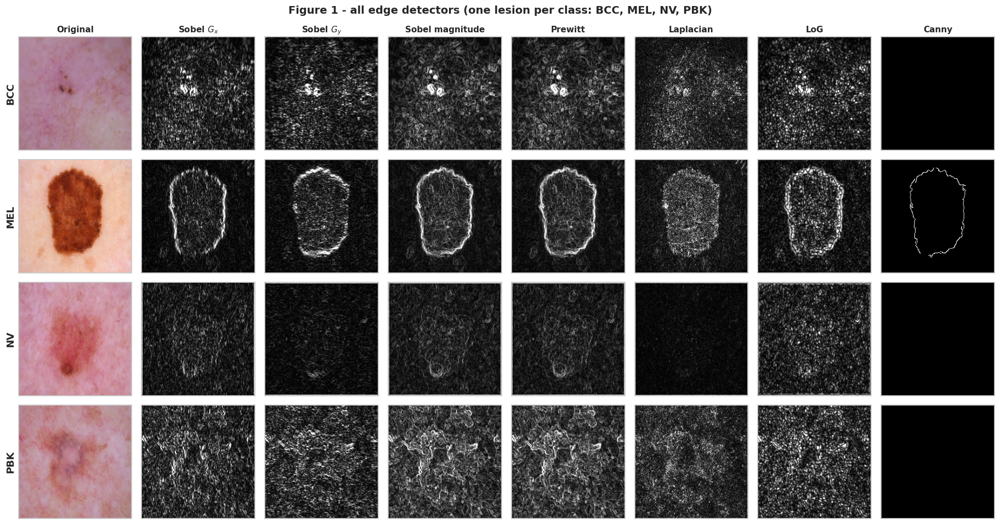

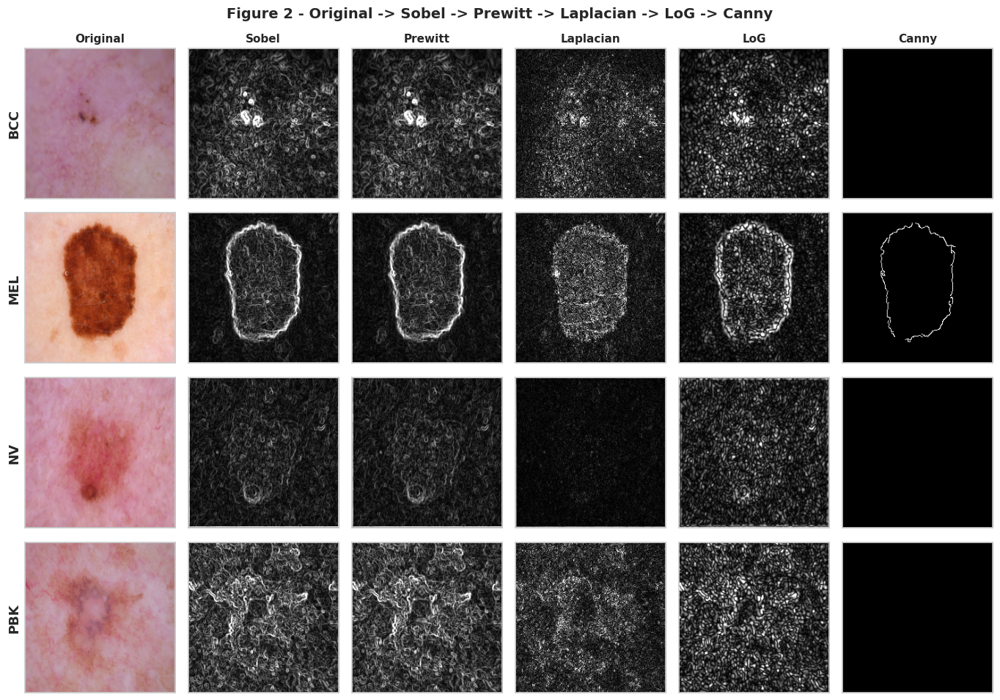

In [7]:
sample_ids = [int(np.where(trainval_labels == c)[0][5]) for c in range(NUM_CLASSES)]   # same lesions as Lab 2

def t1_panel(g, code):
    if code == "gx": return _norm8(np.abs(sobel_gx(g)))
    if code == "gy": return _norm8(np.abs(sobel_gy(g)))
    return edge_display(g, code)

T1_FULL = [("Original", None), ("Sobel $G_x$", "gx"), ("Sobel $G_y$", "gy"), ("Sobel magnitude", "Sobel"),
           ("Prewitt", "Prewitt"), ("Laplacian", "Laplacian"), ("LoG", "LoG"), ("Canny", "Canny")]
T1_REQ  = [("Original", None), ("Sobel", "Sobel"), ("Prewitt", "Prewitt"),
           ("Laplacian", "Laplacian"), ("LoG", "LoG"), ("Canny", "Canny")]

def plot_task1(cols, fname, title):
    fig, axes = plt.subplots(NUM_CLASSES, len(cols), figsize=(2.3 * len(cols), 2.45 * NUM_CLASSES))
    for r, sid in enumerate(sample_ids):
        img = RAW_TRAINVAL[sid]; g = to_gray(img)
        for c, (name, code) in enumerate(cols):
            ax = axes[r, c]
            if code is None: ax.imshow(img)
            else:            ax.imshow(t1_panel(g, code), cmap="gray", vmin=0, vmax=255)
            ax.set_xticks([]); ax.set_yticks([])
            if r == 0: ax.set_title(name, fontsize=11, fontweight="bold")
            if c == 0: ax.set_ylabel(f"{SHORT_NAMES[r]}", fontsize=13, fontweight="bold")
    plt.suptitle(title, fontsize=14, fontweight="bold")
    plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/{fname}", dpi=150); plt.show()

plot_task1(T1_FULL, "fig1_all_edge_detectors.png",
           "Figure 1 - all edge detectors (one lesion per class: BCC, MEL, NV, PBK)")
plot_task1(T1_REQ, "fig2_required_edge_comparison.png",
           "Figure 2 - Original -> Sobel -> Prewitt -> Laplacian -> LoG -> Canny")

## 4. Task 2 — Effect of noise and pre-processing on edge detection

**Noise:** Gaussian (sigma = 25) and salt-and-pepper (5 % of pixels).
**Pre-processing:** Gaussian filter (5x5, sigma 1) and Median filter (3x3) — exactly the Lab-02 filters.
Seven input conditions are evaluated for every detector: `Original`, `Gaussian noise`, `Gaussian noise + Gaussian filter`,
`Gaussian noise + Median filter`, `S&P noise`, `S&P + Gaussian filter`, `S&P + Median filter`.

Statistics are averaged over **16 lesions (4 per class)** taken from the *train/val* pool — the test set is never used
for design decisions. Table 1 is **filled automatically** from the measured metrics.

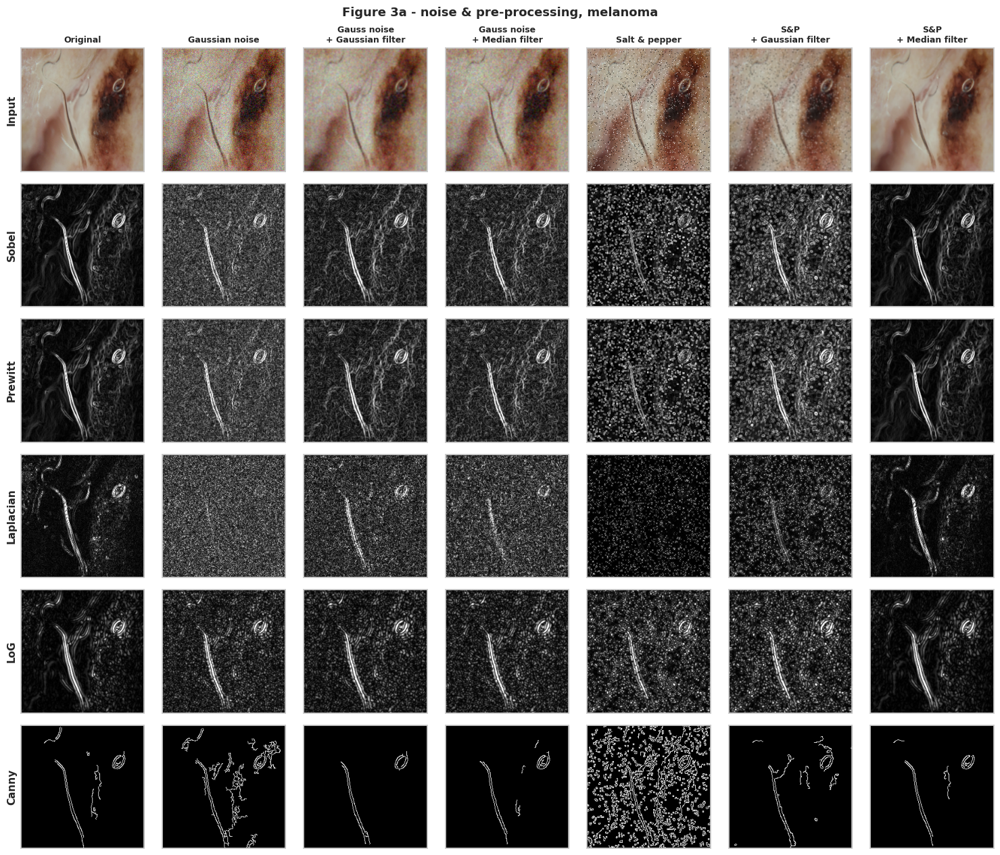

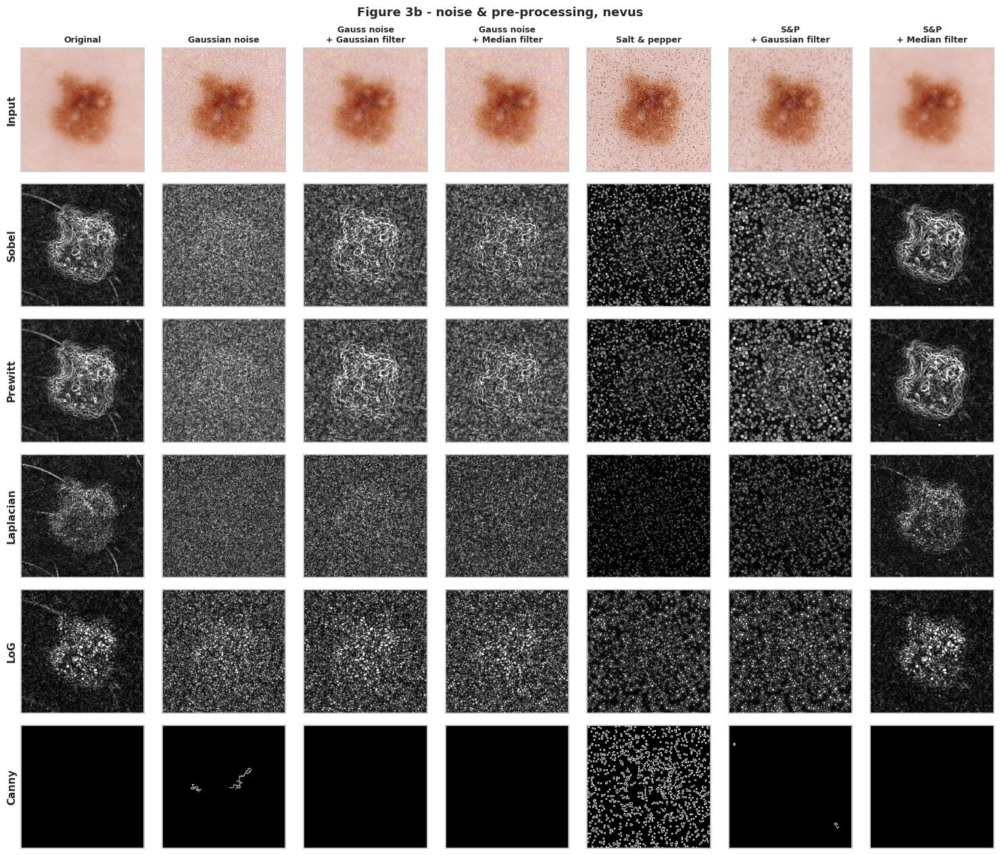

In [8]:
# ---------- analysis images: N per class, chosen with a fixed seed from the train/val pool ----------
rng_an = np.random.default_rng(SEED)
analysis_ids = np.concatenate([rng_an.choice(np.where(trainval_labels == c)[0], N_PER_CLASS_ANALYSIS, replace=False)
                               for c in range(NUM_CLASSES)])
analysis_imgs   = RAW_TRAINVAL[analysis_ids]
analysis_labels = trainval_labels[analysis_ids]

COND_META = {   # key: (Input Image, Noise Type, Preprocessing)
    "orig":     ("Original", "None",          "None"),
    "g":        ("Noisy",    "Gaussian",      "None"),
    "sp":       ("Noisy",    "Salt & Pepper", "None"),
    "g_gauss":  ("Noisy",    "Gaussian",      "Gaussian Filter"),
    "sp_med":   ("Noisy",    "Salt & Pepper", "Median Filter"),
    "g_med":    ("Noisy",    "Gaussian",      "Median Filter"),
    "sp_gauss": ("Noisy",    "Salt & Pepper", "Gaussian Filter"),
}
FIG_COND_ORDER = ["orig", "g", "g_gauss", "g_med", "sp", "sp_gauss", "sp_med"]
COND_TITLES = {"orig": "Original", "g": "Gaussian noise", "g_gauss": "Gauss noise\n+ Gaussian filter",
               "g_med": "Gauss noise\n+ Median filter", "sp": "Salt & pepper", "sp_gauss": "S&P\n+ Gaussian filter",
               "sp_med": "S&P\n+ Median filter"}

def make_conditions(img, seed):
    rng = np.random.default_rng(seed)
    g_noisy  = add_gaussian_noise(img, rng)
    sp_noisy = add_salt_pepper(img, rng)
    return {"orig": img, "g": g_noisy, "sp": sp_noisy,
            "g_gauss": f_gaussian(g_noisy), "g_med": f_median(g_noisy),
            "sp_gauss": f_gaussian(sp_noisy), "sp_med": f_median(sp_noisy)}

# ---------- visual: input images + the 5 detectors under every condition ----------
def plot_noise_figure(ai, fname, title):
    img = analysis_imgs[ai]; conds = make_conditions(img, SEED + ai)
    rows = ["Input"] + DETECTORS
    fig, axes = plt.subplots(len(rows), len(FIG_COND_ORDER), figsize=(2.15 * len(FIG_COND_ORDER), 2.15 * len(rows)))
    for c, ck in enumerate(FIG_COND_ORDER):
        x = conds[ck]; g = to_gray(x)
        axes[0, c].imshow(x); axes[0, c].set_title(COND_TITLES[ck], fontsize=9, fontweight="bold")
        for r, m in enumerate(DETECTORS, start=1):
            axes[r, c].imshow(edge_display(g, m), cmap="gray", vmin=0, vmax=255)
    for r, name in enumerate(rows):
        for c in range(len(FIG_COND_ORDER)):
            axes[r, c].set_xticks([]); axes[r, c].set_yticks([])
        axes[r, 0].set_ylabel(name, fontsize=11, fontweight="bold")
    plt.suptitle(title, fontsize=13, fontweight="bold")
    plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/{fname}", dpi=150); plt.show()

first_mel = int(np.where(analysis_labels == 1)[0][0]); first_nv = int(np.where(analysis_labels == 2)[0][0])
plot_noise_figure(first_mel, "fig3_noise_melanoma.png", "Figure 3a - noise & pre-processing, melanoma")
plot_noise_figure(first_nv,  "fig3_noise_nevus.png",    "Figure 3b - noise & pre-processing, nevus")

560 edge maps evaluated in 2.2s


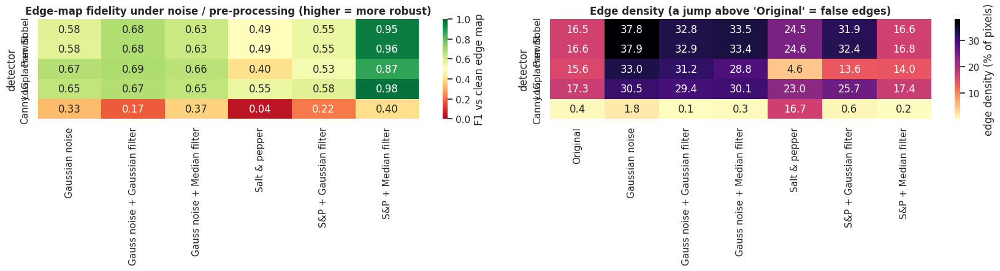

In [9]:
# ---------- quantitative evaluation: 16 images x 7 conditions x 5 detectors ----------
t0 = time.time(); records = []
for ii, img in enumerate(analysis_imgs):
    conds = make_conditions(img, SEED + ii)
    refs  = {m: edge_binary(to_gray(img), m) for m in DETECTORS}          # clean-image edge map of each detector
    for ck, x in conds.items():
        gx = to_gray(x)
        for m in DETECTORS:
            r = edge_metrics(edge_binary(gx, m), refs[m])
            r.update(detector=m, cond=ck); records.append(r)
REC = pd.DataFrame(records)
EXT = REC.groupby(["detector", "cond"], sort=False).mean(numeric_only=True).reset_index()   # extended Table 1
print(f"{len(records)} edge maps evaluated in {time.time()-t0:.1f}s")

# heat-map: how much of the clean edge structure survives (F1 vs clean edge map)
piv = EXT[EXT.cond != "orig"].pivot(index="detector", columns="cond", values="f1").reindex(index=DETECTORS, columns=FIG_COND_ORDER[1:])
piv.columns = [COND_TITLES[c].replace("\n", " ") for c in piv.columns]
fig, axes = plt.subplots(1, 2, figsize=(17, 4.6))
sns.heatmap(piv, annot=True, fmt=".2f", cmap="RdYlGn", vmin=0, vmax=1, ax=axes[0], cbar_kws={"label": "F1 vs clean edge map"})
axes[0].set_title("Edge-map fidelity under noise / pre-processing (higher = more robust)", fontweight="bold")
piv_d = EXT.pivot(index="detector", columns="cond", values="density").reindex(index=DETECTORS, columns=FIG_COND_ORDER)
piv_d.columns = [COND_TITLES[c].replace("\n", " ") for c in piv_d.columns]
sns.heatmap(piv_d, annot=True, fmt=".1f", cmap="magma_r", ax=axes[1], cbar_kws={"label": "edge density (% of pixels)"})
axes[1].set_title("Edge density (a jump above 'Original' = false edges)", fontweight="bold")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig4_noise_robustness.png", dpi=150); plt.show()

### 4.1 Table 1 — Effect of Noise and Preprocessing on Edge Detection
*Edge Quality* and *Noise Sensitivity* are derived from the measured F1 against the clean edge map
(Good >= 0.80, Fair >= 0.60, Poor < 0.60; sensitivity = 1 - F1: Low < 20 pp, Moderate < 40 pp, High >= 40 pp).
For `Original` rows the map *is* the reference, so quality is described by edge width and continuity instead.

In [10]:
def rate_quality(f1):  return "Good" if f1 >= 0.80 else ("Fair" if f1 >= 0.60 else "Poor")
def rate_sens(f1):
    drop = 100 * (1 - f1)
    return "Low" if drop < 20 else ("Moderate" if drop < 40 else "High")
def sharp_label(w):
    if w != w: return "no edges found"
    return "thin / sharp" if w <= 1.5 else ("medium width" if w <= 2.2 else "thick / blurred")
def cont_label(fr):
    if fr != fr: return "no edges found"
    return "continuous" if fr <= 25 else ("partly fragmented" if fr <= 60 else "highly fragmented")

DETECTOR_NOTE = {
    "Sobel":     "Design: 1st-order gradient with built-in 3-px weighted smoothing; responses are wide.",
    "Prewitt":   "Design: 1st-order gradient with unweighted 3-px smoothing; very close to Sobel, slightly noisier.",
    "Laplacian": "Design: 2nd-order isotropic operator with no smoothing; thin but amplifies every noisy pixel.",
    "LoG":       "Design: Gaussian smoothing before the Laplacian; suppresses fine noise but blurs weak detail.",
    "Canny":     "Design: smoothing + non-max suppression + hysteresis; 1-px edges linked into contours.",
}
E = EXT.set_index(["detector", "cond"])

def table1_row(det, ck, preproc_override=None):
    r = E.loc[(det, ck)]; inp, noise, pre = COND_META[ck]
    if preproc_override: pre = preproc_override
    base = E.loc[(det, "orig")]
    if ck == "orig":
        quality = f"Reference - {sharp_label(r.width)}, {cont_label(r.fragments)}"
        sens = "n/a (reference)"
        obs = (f"Edge density {r.density:.1f}% of pixels; width {r.width:.2f}x skeleton; {r.fragments:.0f} fragments per 1000 edge px. "
               + DETECTOR_NOTE[det])
        f1 = prec = rec = np.nan
    else:
        f1, prec, rec = r.f1, r.precision, r.recall
        quality = f"{rate_quality(f1)} (F1={f1:.2f})"
        sens = f"{rate_sens(f1)} (drop {100*(1-f1):.0f} pp)"
        obs = (f"{100*(1-prec):.0f}% of detected edge px are false edges, {100*(1-rec):.0f}% of clean edge px are missing/broken; "
               f"density {base.density:.1f}%->{r.density:.1f}%; {r.fragments:.0f} fragments/1000 px (clean {base.fragments:.0f}); "
               f"width {r.width:.2f}x.")
        if ck in ("g_gauss", "g_med", "sp_gauss", "sp_med"):
            unf = E.loc[(det, "g" if ck.startswith("g_") else "sp")]
            obs += f" Filtering changed F1 by {f1-unf.f1:+.2f} vs the unfiltered noisy input."
    return {"Edge Detector": det, "Input Image": inp, "Noise Type": noise, "Preprocessing": pre,
            "Edge Quality": quality, "Noise Sensitivity": sens, "Observations": obs,
            "Edge density (%)": round(r.density, 2), "Precision": round(prec, 3) if prec == prec else np.nan,
            "Recall": round(rec, 3) if rec == rec else np.nan, "F1 vs clean": round(f1, 3) if f1 == f1 else np.nan,
            "Fragments /1k px": round(r.fragments, 1), "Edge width (x skel.)": round(r.width, 2)}

TABLE1_ROWS = [("Sobel", "orig"), ("Sobel", "g"), ("Sobel", "sp"), ("Sobel", "g_gauss"), ("Sobel", "sp_med"),
               ("Prewitt", "orig"), ("Laplacian", "orig"), ("LoG", "g_gauss"),
               ("Canny", "orig"), ("Canny", "g_gauss"), ("Canny", "sp_med")]
TABLE1 = pd.DataFrame([table1_row(d, c, "Built-in smoothing" if (d == "Canny" and c == "orig") else None) for d, c in TABLE1_ROWS])
TABLE1.to_csv(f"{RESULT_DIR}/table1_noise_preprocessing.csv", index=False)

pd.set_option("display.max_colwidth", None)
display(TABLE1.style.hide(axis="index").set_properties(**{"text-align": "left", "white-space": "pre-wrap"})
        .background_gradient(subset=["F1 vs clean"], cmap="RdYlGn", vmin=0, vmax=1))

Edge Detector,Input Image,Noise Type,Preprocessing,Edge Quality,Noise Sensitivity,Observations,Edge density (%),Precision,Recall,F1 vs clean,Fragments /1k px,Edge width (x skel.)
Sobel,Original,None,None,"Reference - medium width, partly fragmented",n/a (reference),Edge density 16.5% of pixels; width 2.01x skeleton; 56 fragments per 1000 edge px. Design: 1st-order gradient with built-in 3-px weighted smoothing; responses are wide.,16.500000,nan,nan,nan,56.100000,2.010000
Sobel,Noisy,Gaussian,None,Poor (F1=0.58),High (drop 42 pp),"57% of detected edge px are false edges, 3% of clean edge px are missing/broken; density 16.5%->37.8%; 45 fragments/1000 px (clean 56); width 1.39x.",37.800000,0.435000,0.974000,0.580000,45.100000,1.390000
Sobel,Noisy,Salt & Pepper,None,Poor (F1=0.49),High (drop 51 pp),"59% of detected edge px are false edges, 30% of clean edge px are missing/broken; density 16.5%->24.5%; 65 fragments/1000 px (clean 56); width 1.64x.",24.510000,0.409000,0.697000,0.492000,64.900000,1.640000
Sobel,Noisy,Gaussian,Gaussian Filter,Fair (F1=0.68),Moderate (drop 32 pp),"45% of detected edge px are false edges, 6% of clean edge px are missing/broken; density 16.5%->32.8%; 52 fragments/1000 px (clean 56); width 1.97x. Filtering changed F1 by +0.10 vs the unfiltered noisy input.",32.840000,0.548000,0.940000,0.678000,52.300000,1.970000
Sobel,Noisy,Salt & Pepper,Median Filter,Good (F1=0.95),Low (drop 5 pp),"3% of detected edge px are false edges, 6% of clean edge px are missing/broken; density 16.5%->16.6%; 38 fragments/1000 px (clean 56); width 2.47x. Filtering changed F1 by +0.46 vs the unfiltered noisy input.",16.610000,0.971000,0.940000,0.954000,37.500000,2.470000
Prewitt,Original,None,None,"Reference - medium width, partly fragmented",n/a (reference),"Edge density 16.6% of pixels; width 2.05x skeleton; 56 fragments per 1000 edge px. Design: 1st-order gradient with unweighted 3-px smoothing; very close to Sobel, slightly noisier.",16.560000,nan,nan,nan,55.700000,2.050000
Laplacian,Original,None,None,"Reference - thin / sharp, highly fragmented",n/a (reference),Edge density 15.6% of pixels; width 1.30x skeleton; 192 fragments per 1000 edge px. Design: 2nd-order isotropic operator with no smoothing; thin but amplifies every noisy pixel.,15.570000,nan,nan,nan,192.400000,1.300000
LoG,Noisy,Gaussian,Gaussian Filter,Fair (F1=0.67),Moderate (drop 33 pp),"44% of detected edge px are false edges, 10% of clean edge px are missing/broken; density 17.3%->29.4%; 84 fragments/1000 px (clean 70); width 2.79x. Filtering changed F1 by +0.03 vs the unfiltered noisy input.",29.400000,0.557000,0.896000,0.673000,84.100000,2.790000
Canny,Original,None,Built-in smoothing,"Reference - thin / sharp, partly fragmented",n/a (reference),Edge density 0.4% of pixels; width 1.30x skeleton; 36 fragments per 1000 edge px. Design: smoothing + non-max suppression + hysteresis; 1-px edges linked into contours.,0.420000,nan,nan,nan,35.700000,1.300000
Canny,Noisy,Gaussian,Gaussian Filter,Poor (F1=0.17),High (drop 83 pp),"67% of detected edge px are false edges, 85% of clean edge px are missing/broken; density 0.4%->0.1%; 30 fragments/1000 px (clean 36); width 1.36x. Filtering changed F1 by -0.15 vs the unfiltered noisy input.",0.110000,0.331000,0.146000,0.174000,30.200000,1.360000


#### Extended Table 1 — *every* detector under *every* condition (basis for the discussion answers)

In [11]:
TABLE1_EXT = pd.DataFrame([table1_row(d, ck) for d in DETECTORS for ck in FIG_COND_ORDER])
TABLE1_EXT.to_csv(f"{RESULT_DIR}/table1_extended.csv", index=False)
display(TABLE1_EXT.drop(columns=["Observations"]).style.hide(axis="index")
        .background_gradient(subset=["F1 vs clean"], cmap="RdYlGn", vmin=0, vmax=1))

sens_rank = EXT[EXT.cond.isin(["g", "sp"])].groupby("detector")["f1"].mean().sort_values()
print("\nMean F1 vs clean under unfiltered noise (lower = more noise-sensitive):")
print(sens_rank.round(3).to_string())

Edge Detector,Input Image,Noise Type,Preprocessing,Edge Quality,Noise Sensitivity,Edge density (%),Precision,Recall,F1 vs clean,Fragments /1k px,Edge width (x skel.)
Sobel,Original,None,None,"Reference - medium width, partly fragmented",n/a (reference),16.500000,nan,nan,nan,56.100000,2.010000
Sobel,Noisy,Gaussian,None,Poor (F1=0.58),High (drop 42 pp),37.800000,0.435000,0.974000,0.580000,45.100000,1.390000
Sobel,Noisy,Gaussian,Gaussian Filter,Fair (F1=0.68),Moderate (drop 32 pp),32.840000,0.548000,0.940000,0.678000,52.300000,1.970000
Sobel,Noisy,Gaussian,Median Filter,Fair (F1=0.63),Moderate (drop 37 pp),33.480000,0.492000,0.935000,0.627000,52.400000,1.750000
Sobel,Noisy,Salt & Pepper,None,Poor (F1=0.49),High (drop 51 pp),24.510000,0.409000,0.697000,0.492000,64.900000,1.640000
Sobel,Noisy,Salt & Pepper,Gaussian Filter,Poor (F1=0.55),High (drop 45 pp),31.940000,0.442000,0.822000,0.554000,32.700000,2.270000
Sobel,Noisy,Salt & Pepper,Median Filter,Good (F1=0.95),Low (drop 5 pp),16.610000,0.971000,0.940000,0.954000,37.500000,2.470000
Prewitt,Original,None,None,"Reference - medium width, partly fragmented",n/a (reference),16.560000,nan,nan,nan,55.700000,2.050000
Prewitt,Noisy,Gaussian,None,Poor (F1=0.58),High (drop 42 pp),37.950000,0.431000,0.979000,0.578000,65.400000,1.390000
Prewitt,Noisy,Gaussian,Gaussian Filter,Fair (F1=0.68),Moderate (drop 32 pp),32.900000,0.549000,0.941000,0.679000,51.700000,2.010000



Mean F1 vs clean under unfiltered noise (lower = more noise-sensitive):
detector
Canny        0.185
Prewitt      0.536
Sobel        0.536
Laplacian    0.537
LoG          0.600


## 5. Task 3 — Canny parameter analysis (Table 2) and choice of the best edge representation

Six Canny configurations are compared: the three required threshold pairs at a 3x3 Gaussian kernel, the 50/150 pair at
5x5 (`Canny-4`, the kernel-size test), and two extra 5x5 pairs (`Canny-5`, `Canny-6`) to separate the effect of the
kernel from the effect of the thresholds. For every configuration:

* **Number of detected edges** = mean edge pixels / mean connected edge segments per image over **all 1 633 train+val images**
* **Noise F1** = fidelity of the edge map when Gaussian noise (sigma 25) is added (16 analysis images)
* **Probe val macro-F1** = how *useful* the edge map is for classification: a fast HOG + logistic-regression probe is fitted on the
  **training** edge maps and scored on the **validation** edge maps (the test set is not touched). This is the number used to
  pick the "most useful edge representation for the selected dataset".

In [12]:
# ---------- fast, validation-only usefulness probe ----------
def probe_features(maps):
    def one(e):
        e64 = cv2.resize(e, (64, 64), interpolation=cv2.INTER_AREA)
        h = hog(e64, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), feature_vector=True)
        d = cv2.resize(e, (16, 16), interpolation=cv2.INTER_AREA).astype(np.float32).ravel() / 255.0
        return np.concatenate([h, d]).astype(np.float32)
    with ThreadPoolExecutor(max_workers=4) as ex:
        return np.stack(list(ex.map(one, maps)))

def probe_score(maps_trainval):
    X = probe_features(maps_trainval)
    sc = StandardScaler().fit(X[train_idx])
    clf = LogisticRegression(C=0.05, max_iter=500, class_weight="balanced", random_state=SEED)
    clf.fit(sc.transform(X[train_idx]), y_train_np)
    p = clf.predict(sc.transform(X[val_idx]))
    return 100 * f1_score(y_val_np, p, average="macro", zero_division=0), 100 * accuracy_score(y_val_np, p)

def noise_f1(method, **kw):
    out = []
    for ii, img in enumerate(analysis_imgs):
        noisy = add_gaussian_noise(img, np.random.default_rng(SEED + ii))
        ref = edge_binary(to_gray(img), method, **kw)
        out.append(edge_metrics(edge_binary(to_gray(noisy), method, **kw), ref)["f1"])
    return float(np.mean(out))

def binarize_maps(maps, method):
    """0/255 maps -> {0,1}. Canny is already binary; other detectors use Otsu (same rule as edge_binary)."""
    if method == "Canny": return (maps > 0).astype(np.uint8)
    return np.stack([(cv2.threshold(m, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1] > 0).astype(np.uint8) for m in maps])

def map_stats(maps, method="Canny"):
    b = binarize_maps(maps, method)
    px  = b.reshape(len(b), -1).sum(1)
    seg = np.array([max(cv2.connectedComponents(x, connectivity=8)[0] - 1, 0) for x in b])
    return float(px.mean()), float(seg.mean()), float(100 * px.mean() / (IMG_SIZE * IMG_SIZE))

CANNY_CONFIGS = [("Canny-1", 30, 100, 3), ("Canny-2", 50, 150, 3), ("Canny-3", 100, 200, 3),
                 ("Canny-4", 50, 150, 5), ("Canny-5", 30, 100, 5), ("Canny-6", 100, 200, 5)]

t0 = time.time(); rows = []
CANNY_MAPS_SAMPLE = {}
for name, lo, hi, k in CANNY_CONFIGS:
    maps = edge_stack(RAW_TRAINVAL, "Canny", low=lo, high=hi, ksize=k)
    px, seg, dens = map_stats(maps)
    pf1, pacc = probe_score(maps)
    nf1 = noise_f1("Canny", low=lo, high=hi, ksize=k)
    CANNY_MAPS_SAMPLE[name] = maps[sample_ids]
    rows.append(dict(cfg=name, low=lo, high=hi, k=k, px=px, seg=seg, dens=dens, probe_f1=pf1, probe_acc=pacc, noise_f1=nf1))
    print(f"{name}: {lo}/{hi} k={k}  edges/img={px:7.0f}  segments={seg:6.1f}  probe val F1={pf1:5.1f}%  noise F1={nf1:.2f}")
T2raw = pd.DataFrame(rows)
print(f"done in {time.time()-t0:.1f}s")

Canny-1: 30/100 k=3  edges/img=   1186  segments=  17.5  probe val F1= 38.0%  noise F1=0.16
Canny-2: 50/150 k=3  edges/img=    409  segments=   6.2  probe val F1= 35.3%  noise F1=0.33
Canny-3: 100/200 k=3  edges/img=    143  segments=   3.0  probe val F1= 31.6%  noise F1=0.28
Canny-4: 50/150 k=5  edges/img=    219  segments=   3.0  probe val F1= 28.0%  noise F1=0.31
Canny-5: 30/100 k=5  edges/img=    672  segments=  10.2  probe val F1= 41.1%  noise F1=0.35
Canny-6: 100/200 k=5  edges/img=     59  segments=   1.1  probe val F1= 21.3%  noise F1=0.06
done in 38.9s


Configuration,Low Threshold,High Threshold,Kernel Size,Edge Quality,Number of Detected Edges,Observation,Edge px / img,Segments / img,Density (%),Noise F1 (Gaussian),Probe val macro-F1 (%),Rank
Canny-1,30,100,3x3,Fair (probe F1 38.0%),1186 px in 17 segments,"2.90x the edge pixels of Canny-2, 17 segments/img (hysteresis ratio 3.3); clearly more weak edges (texture / hair) admitted than Canny-2; noise F1 0.16.",1186,17.500000,2.360000,0.160000,37.990000,2
Canny-2,50,150,3x3,Poor (probe F1 35.3%),409 px in 6 segments,"1.00x the edge pixels of Canny-2, 6 segments/img (hysteresis ratio 3.0); very sparse map - only the strongest gradients survive, parts of the lesion border may be lost; noise F1 0.33.",409,6.200000,0.810000,0.327000,35.320000,3
Canny-3,100,200,3x3,Poor (probe F1 31.6%),143 px in 3 segments,"0.35x the edge pixels of Canny-2, 3 segments/img (hysteresis ratio 2.0); very sparse map - only the strongest gradients survive, parts of the lesion border may be lost; noise F1 0.28.",143,3.000000,0.290000,0.278000,31.560000,4
Canny-4,50,150,5x5,Poor (probe F1 28.0%),219 px in 3 segments,"0.54x the edge pixels of Canny-2, 3 segments/img (hysteresis ratio 3.0); very sparse map - only the strongest gradients survive, parts of the lesion border may be lost; noise F1 0.31.",219,3.000000,0.440000,0.308000,28.040000,5
Canny-5,30,100,5x5,Best (probe F1 41.1%),672 px in 10 segments,"1.65x the edge pixels of Canny-2, 10 segments/img (hysteresis ratio 3.3); very sparse map - only the strongest gradients survive, parts of the lesion border may be lost; noise F1 0.35.",672,10.200000,1.340000,0.352000,41.090000,1
Canny-6,100,200,5x5,Poor (probe F1 21.3%),59 px in 1 segments,"0.14x the edge pixels of Canny-2, 1 segments/img (hysteresis ratio 2.0); very sparse map - only the strongest gradients survive, parts of the lesion border may be lost; noise F1 0.06.",59,1.100000,0.120000,0.058000,21.300000,6


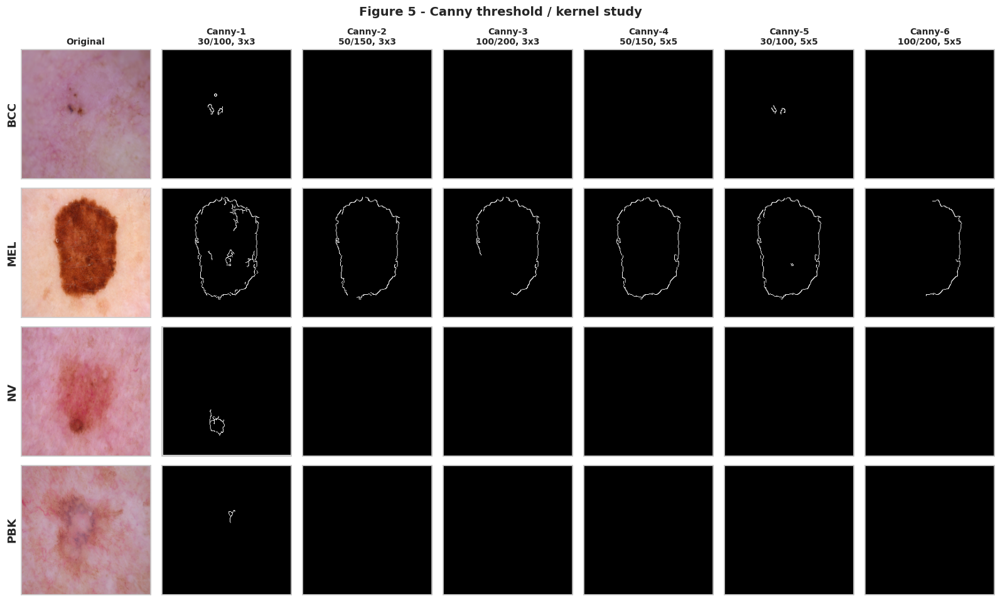

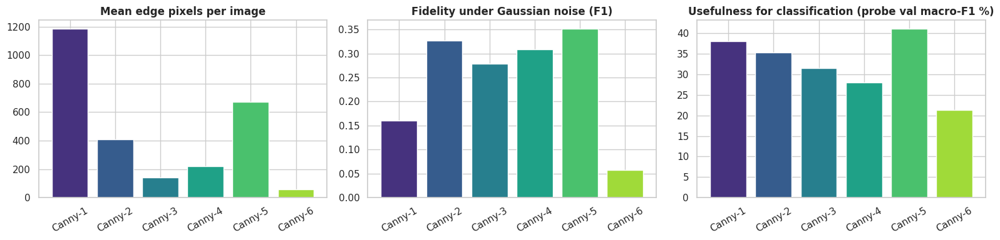

Best Canny configuration: Canny-5 -> {'low': 30, 'high': 100, 'ksize': 5}


In [13]:
# ---------- Table 2 ----------
base = T2raw[T2raw.cfg == "Canny-2"].iloc[0]
best_probe = T2raw.probe_f1.max()
T2raw["rank"] = T2raw.probe_f1.rank(ascending=False, method="min").astype(int)

def canny_obs(r):
    ratio = r["px"] / base["px"]
    if r["dens"] > 20:   regime = "very dense map - skin texture, hair and speckle are kept as edges (over-detection)"
    elif r["dens"] < 2:  regime = "very sparse map - only the strongest gradients survive, parts of the lesion border may be lost"
    elif r["px"] > 1.4 * base["px"]: regime = "clearly more weak edges (texture / hair) admitted than Canny-2"
    elif r["px"] < 0.7 * base["px"]: regime = "clearly fewer edges than Canny-2; weak parts of the lesion border may break"
    else:                regime = "similar amount of detail and clutter as Canny-2"
    return (f"{ratio:.2f}x the edge pixels of Canny-2, {r['seg']:.0f} segments/img (hysteresis ratio {r['high']/r['low']:.1f}); {regime}; "
            f"noise F1 {r['noise_f1']:.2f}.")

def canny_quality(r):
    gap = best_probe - r["probe_f1"]
    lab = "Best" if gap < 1e-9 else ("Good" if gap <= 2 else ("Fair" if gap <= 5 else "Poor"))
    return f"{lab} (probe F1 {r['probe_f1']:.1f}%)"

TABLE2 = pd.DataFrame([{
    "Configuration": r["cfg"], "Low Threshold": int(r["low"]), "High Threshold": int(r["high"]), "Kernel Size": f"{int(r['k'])}x{int(r['k'])}",
    "Edge Quality": canny_quality(r),
    "Number of Detected Edges": f"{r['px']:.0f} px in {r['seg']:.0f} segments",
    "Observation": canny_obs(r),
    "Edge px / img": round(r["px"]), "Segments / img": round(r["seg"], 1), "Density (%)": round(r["dens"], 2),
    "Noise F1 (Gaussian)": round(r["noise_f1"], 3), "Probe val macro-F1 (%)": round(r["probe_f1"], 2), "Rank": int(r["rank"]),
} for _, r in T2raw.iterrows()])
TABLE2.to_csv(f"{RESULT_DIR}/table2_canny_parameters.csv", index=False)
display(TABLE2.style.hide(axis="index").set_properties(**{"text-align": "left", "white-space": "pre-wrap"})
        .background_gradient(subset=["Probe val macro-F1 (%)"], cmap="RdYlGn"))

# ---------- figure: Original + all Canny configurations ----------
cols = ["Original"] + [c[0] for c in CANNY_CONFIGS]
fig, axes = plt.subplots(NUM_CLASSES, len(cols), figsize=(2.3 * len(cols), 2.45 * NUM_CLASSES))
for r, sid in enumerate(sample_ids):
    axes[r, 0].imshow(RAW_TRAINVAL[sid])
    for c, (name, lo, hi, k) in enumerate(CANNY_CONFIGS, start=1):
        axes[r, c].imshow(CANNY_MAPS_SAMPLE[name][r], cmap="gray", vmin=0, vmax=255)
    for c in range(len(cols)):
        axes[r, c].set_xticks([]); axes[r, c].set_yticks([])
    axes[r, 0].set_ylabel(SHORT_NAMES[r], fontsize=13, fontweight="bold")
for c, (name, lo, hi, k) in enumerate(CANNY_CONFIGS, start=1):
    axes[0, c].set_title(f"{name}\n{lo}/{hi}, {k}x{k}", fontsize=10, fontweight="bold")
axes[0, 0].set_title("Original", fontsize=10, fontweight="bold")
plt.suptitle("Figure 5 - Canny threshold / kernel study", fontsize=14, fontweight="bold")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig5_canny_parameters.png", dpi=150); plt.show()

# ---------- trade-off plot ----------
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
axes[0].bar(T2raw.cfg, T2raw.px, color=sns.color_palette("viridis", len(T2raw))); axes[0].set_title("Mean edge pixels per image", fontweight="bold")
axes[1].bar(T2raw.cfg, T2raw.noise_f1, color=sns.color_palette("viridis", len(T2raw))); axes[1].set_title("Fidelity under Gaussian noise (F1)", fontweight="bold")
axes[2].bar(T2raw.cfg, T2raw.probe_f1, color=sns.color_palette("viridis", len(T2raw))); axes[2].set_title("Usefulness for classification (probe val macro-F1 %)", fontweight="bold")
for ax in axes: ax.tick_params(axis="x", rotation=30)
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig6_canny_tradeoff.png", dpi=150); plt.show()

# ---------- choose the best Canny configuration ----------
if CANNY_OVERRIDE is not None:
    BEST_CANNY = dict(CANNY_OVERRIDE); best_canny_name = "override"
else:
    b = T2raw.sort_values(["probe_f1", "noise_f1"], ascending=False).iloc[0]
    BEST_CANNY = dict(low=int(b.low), high=int(b.high), ksize=int(b.k)); best_canny_name = b["cfg"]
print(f"Best Canny configuration: {best_canny_name} -> {BEST_CANNY}")

### 5.1 Which edge detector is the most useful representation overall?
The best Canny configuration is compared with Sobel, Prewitt, Laplacian and LoG using the same validation-only probe
(the test set is never used). The winner becomes **Set C** in Task 4 (override with `EDGE_METHOD_OVERRIDE` if your instructor prefers a specific detector).

In [14]:
cand = {"Sobel": ("Sobel", {}), "Prewitt": ("Prewitt", {}), "Laplacian": ("Laplacian", {}), "LoG": ("LoG", {}),
        f"Canny (best: {BEST_CANNY['low']}/{BEST_CANNY['high']}, {BEST_CANNY['ksize']}x{BEST_CANNY['ksize']})": ("Canny", BEST_CANNY)}
rows = []
for label, (m, kw) in cand.items():
    maps = edge_stack(RAW_TRAINVAL, m, **kw)
    px, seg, dens = map_stats(maps, m)
    pf1, pacc = probe_score(maps)
    rows.append({"Detector": label, "method": m, "kw": kw, "Density (%)": round(dens, 2),
                 "Noise F1 (Gaussian)": round(noise_f1(m, **kw), 3),
                 "Probe val macro-F1 (%)": round(pf1, 2), "Probe val acc (%)": round(pacc, 2)})
DET_SEL = pd.DataFrame(rows).sort_values("Probe val macro-F1 (%)", ascending=False).reset_index(drop=True)
display(DET_SEL.drop(columns=["method", "kw"]).style.hide(axis="index")
        .background_gradient(subset=["Probe val macro-F1 (%)"], cmap="RdYlGn"))

if EDGE_METHOD_OVERRIDE is not None:
    SELECTED_EDGE = dict(method=EDGE_METHOD_OVERRIDE, kw=BEST_CANNY if EDGE_METHOD_OVERRIDE == "Canny" else {})
else:
    top = DET_SEL.iloc[0]; SELECTED_EDGE = dict(method=top["method"], kw=top["kw"])
SELECTED_EDGE_NAME = SELECTED_EDGE["method"] + (f" ({SELECTED_EDGE['kw']['low']}/{SELECTED_EDGE['kw']['high']}, {SELECTED_EDGE['kw']['ksize']}x{SELECTED_EDGE['kw']['ksize']})" if SELECTED_EDGE["method"] == "Canny" else "")
print("\n>>> Edge representation used for Set C:", SELECTED_EDGE_NAME)
DET_SEL.drop(columns=["method", "kw"]).to_csv(f"{RESULT_DIR}/edge_detector_selection.csv", index=False)

Detector,Density (%),Noise F1 (Gaussian),Probe val macro-F1 (%),Probe val acc (%)
"Canny (best: 30/100, 5x5)",1.340000,0.352000,41.090000,42.200000
Prewitt,16.480000,0.578000,40.180000,40.060000
Sobel,16.400000,0.580000,38.170000,38.230000
LoG,16.620000,0.646000,38.140000,38.230000
Laplacian,13.740000,0.669000,35.900000,36.090000



>>> Edge representation used for Set C: Canny (30/100, 5x5)


## 6. Task 4 — Prepare the three datasets

| Set | Content | Source |
|---|---|---|
| **A – Raw** | original 224x224 RGB lesions | Lab 01 |
| **B – Filtered** | RGB lesions after the best Lab-02 filter (`LAB2_BEST_FILTER`, default **Sharpening**) | Lab 02 |
| **C – Edge** | edge map of the best edge detector from Tasks 1-3, replicated to 3 channels so every network sees a valid RGB tensor | Lab 03 |

All three sets use the **same split, same images, same seed, same epochs, same optimiser and the same metrics**;
only the pixel content differs.

3 datasets built in 1.6s


,Set,Train,Val,Test,Tensor shape,dtype
0,Set A - Raw,1306,327,64,"(224, 224, 3)",uint8
1,Set B - Sharpening filter,1306,327,64,"(224, 224, 3)",uint8
2,"Set C - Canny (30/100, 5x5) edges",1306,327,64,"(224, 224, 3)",uint8


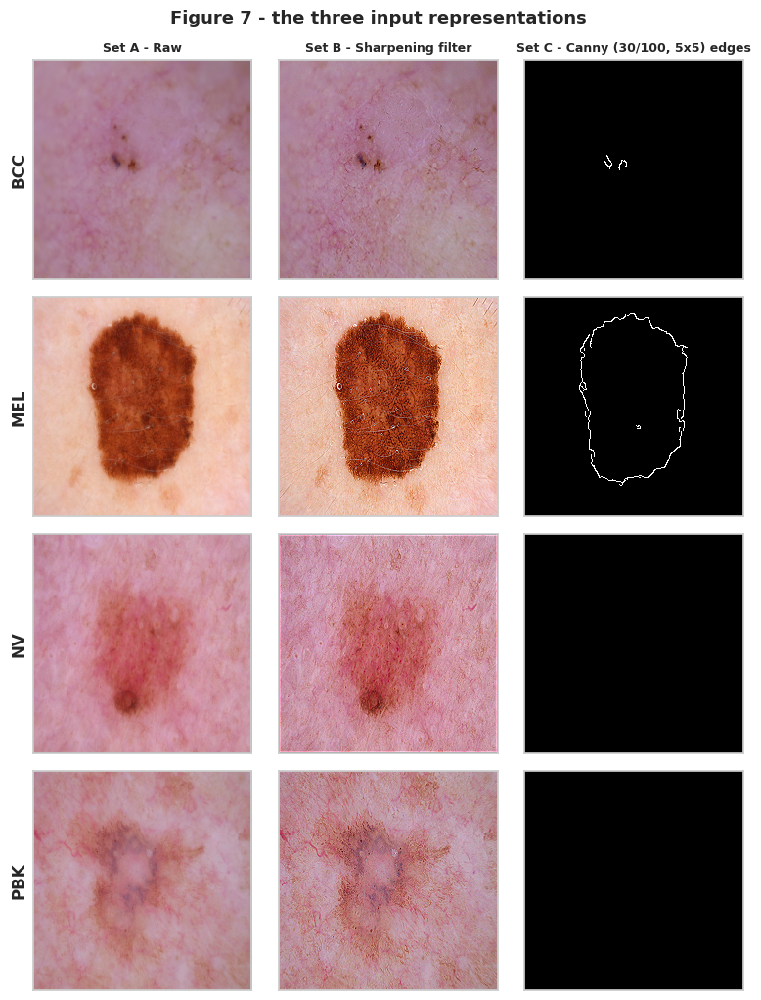

In [15]:
t0 = time.time()
REP_DATA = {}
REP_DATA["Raw"]      = (RAW_TRAINVAL, RAW_TEST)
REP_DATA["Filtered"] = (apply_filter(RAW_TRAINVAL, LAB2_BEST_FILTER), apply_filter(RAW_TEST, LAB2_BEST_FILTER))
REP_DATA["Edge"]     = tuple(to_3ch(edge_stack(a, SELECTED_EDGE["method"], **SELECTED_EDGE["kw"])) for a in (RAW_TRAINVAL, RAW_TEST))
REP_LABEL = {"Raw": "Set A - Raw", "Filtered": f"Set B - {LAB2_BEST_FILTER} filter", "Edge": f"Set C - {SELECTED_EDGE_NAME} edges"}
print(f"3 datasets built in {time.time()-t0:.1f}s")

display(pd.DataFrame([{"Set": REP_LABEL[r], "Train": len(train_idx), "Val": len(val_idx), "Test": len(REP_DATA[r][1]),
                       "Tensor shape": tuple(REP_DATA[r][0].shape[1:]), "dtype": str(REP_DATA[r][0].dtype)} for r in REPS]))

fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(8, 2.6 * NUM_CLASSES))
for r_i, sid in enumerate(sample_ids):
    for c_i, rep in enumerate(REPS):
        axes[r_i, c_i].imshow(REP_DATA[rep][0][sid], cmap="gray" if rep == "Edge" else None)
        axes[r_i, c_i].set_xticks([]); axes[r_i, c_i].set_yticks([])
        if r_i == 0: axes[r_i, c_i].set_title(REP_LABEL[rep], fontsize=9, fontweight="bold")
    axes[r_i, 0].set_ylabel(SHORT_NAMES[r_i], fontsize=12, fontweight="bold")
plt.suptitle("Figure 7 - the three input representations", fontsize=13, fontweight="bold")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig7_three_datasets.png", dpi=150); plt.show()

## 7. Task 5 — Classification on Set A / B / C

### 7.1 Shared utilities and result store
Metrics are **macro-averaged** precision / recall / F1 (the test set is balanced, 16 images per class, so macro and weighted averages coincide).
Every finished run is stored in `classification_results.json`, so re-running the cell after a disconnect resumes where it stopped.

In [16]:
def clf_metrics(y_true, y_pred):
    f = float
    return {"accuracy":  f(accuracy_score(y_true, y_pred) * 100),
            "precision": f(precision_score(y_true, y_pred, average="macro", zero_division=0) * 100),
            "recall":    f(recall_score(y_true, y_pred, average="macro", zero_division=0) * 100),
            "f1":        f(f1_score(y_true, y_pred, average="macro", zero_division=0) * 100)}

def load_results():
    if os.path.exists(RESULT_JSON):
        with open(RESULT_JSON) as fh: return json.load(fh)
    return {}
def save_results(res):
    with open(RESULT_JSON, "w") as fh: json.dump(res, fh, default=float)

# If the configuration changed since the stored runs were made, archive them instead of silently mixing results.
SIG_JSON = f"{RESULT_DIR}/run_signature.json"
RUN_SIG = json.dumps({"filter": LAB2_BEST_FILTER, "edge": SELECTED_EDGE_NAME, "epochs": EPOCHS, "batch": BATCH_SIZE, "img": IMG_SIZE,
                      "lr": [LR_BACKBONE, LR_HEAD], "wd": WEIGHT_DECAY, "ls": LABEL_SMOOTH, "drop": DROPOUT, "cnn": CNN_MODELS}, sort_keys=True)
if os.path.exists(RESULT_JSON) and os.path.exists(SIG_JSON) and open(SIG_JSON).read() != RUN_SIG:
    os.replace(RESULT_JSON, RESULT_JSON + ".old")
    print("Configuration changed since the stored runs -> old results archived, starting fresh.")
open(SIG_JSON, "w").write(RUN_SIG)

RES = load_results()
print(f"Resuming with {len(RES)} stored run(s).")

Resuming with 0 stored run(s).


### 7.2 Classical classifiers: SVM, Random Forest, KNN
Every set is turned into the **same hand-crafted feature vector**: a 32x32x3 down-sampled pixel vector + a HOG descriptor (64x64, 9 bins)
-> standardised -> PCA (128 components, fitted on the training split only).
Hyper-parameters are chosen on the **validation** split (SVM: `C` in {1,10,100}; Random Forest: `max_depth` in {None,20}; KNN: `k` in {3,5,7,11}); the test set is used once.

*Training time* = feature extraction of the training split + scaler/PCA fit + classifier fit.
*Inference time* = per-image feature extraction + (scaler + PCA + prediction) per image, in ms. Both are wall-clock on the Colab CPU.

In [17]:
def clf_feature_one(im):
    small = cv2.resize(im, (32, 32), interpolation=cv2.INTER_AREA).astype(np.float32).ravel() / 255.0
    gray = cv2.cvtColor(cv2.resize(im, (64, 64), interpolation=cv2.INTER_AREA), cv2.COLOR_RGB2GRAY)
    h = hog(gray, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), feature_vector=True)
    return np.concatenate([small, h]).astype(np.float32)

def clf_features(arr):
    with ThreadPoolExecutor(max_workers=8) as ex:
        return np.stack(list(ex.map(clf_feature_one, arr)))

def make_clf(name, p):
    if name == "SVM":
        return SVC(kernel="rbf", C=p["C"], gamma="scale", class_weight="balanced", random_state=SEED)
    if name == "Random Forest":
        return RandomForestClassifier(n_estimators=300, max_depth=p["max_depth"], class_weight="balanced_subsample",
                                      n_jobs=-1, random_state=SEED)
    if name == "KNN":
        return KNeighborsClassifier(n_neighbors=p["k"], weights="distance")
    raise ValueError(name)

GRIDS = {"SVM": [{"C": c} for c in (1, 10, 100)],
         "Random Forest": [{"max_depth": d} for d in (None, 20)],
         "KNN": [{"k": k} for k in (3, 5, 7, 11)]}

def run_classical(rep):
    tv, te = REP_DATA[rep]
    t0 = time.perf_counter(); Ftr = clf_features(tv[train_idx]); t_feat = time.perf_counter() - t0
    Fva = clf_features(tv[val_idx]); Fte = clf_features(te)
    t0 = time.perf_counter()
    scaler = StandardScaler().fit(Ftr)
    pca = PCA(n_components=min(128, len(Ftr) - 1), random_state=SEED).fit(scaler.transform(Ftr))
    Ptr = pca.transform(scaler.transform(Ftr)); t_prep = time.perf_counter() - t0
    Pva = pca.transform(scaler.transform(Fva)); Pte = pca.transform(scaler.transform(Fte))

    t0 = time.perf_counter()
    for im in te: clf_feature_one(im)                       # sequential = per-image latency
    feat_ms = 1000 * (time.perf_counter() - t0) / len(te)

    for name, grid in GRIDS.items():
        best = None
        for p in grid:
            clf = make_clf(name, p)
            t0 = time.perf_counter(); clf.fit(Ptr, y_train_np); t_fit = time.perf_counter() - t0
            f1v = f1_score(y_val_np, clf.predict(Pva), average="macro", zero_division=0)
            if best is None or f1v > best[0]: best = (f1v, p, clf, t_fit)
        f1v, p, clf, t_fit = best
        t0 = time.perf_counter(); pred = clf.predict(pca.transform(scaler.transform(Fte))); t_pred = time.perf_counter() - t0
        RES[f"{name}|{rep}|0"] = {
            "model": name, "family": "classical", "rep": rep, "seed": 0,
            "test": clf_metrics(y_test_np, pred), "val": clf_metrics(y_val_np, clf.predict(Pva)),
            "train_time_s": float(t_feat + t_prep + t_fit), "infer_ms": float(feat_ms + 1000 * t_pred / len(te)),
            "params": p, "y_true": y_test_np.tolist(), "y_pred": [int(v) for v in pred]}
        print(f"  {name:<14} [{rep:<8}] best {p}  val F1 {100*f1v:5.1f}% | TEST acc {RES[f'{name}|{rep}|0']['test']['accuracy']:5.2f}% "
              f"| train {RES[f'{name}|{rep}|0']['train_time_s']:5.1f}s | infer {RES[f'{name}|{rep}|0']['infer_ms']:.2f} ms/img")
    save_results(RES)

for rep in REPS:
    if all(f"{n}|{rep}|0" in RES for n in GRIDS):
        print(f"[{rep}] classical results already stored - skipping."); continue
    print(f"\n--- classical classifiers on {REP_LABEL[rep]} ---")
    run_classical(rep)


--- classical classifiers on Set A - Raw ---
  SVM            [Raw     ] best {'C': 10}  val F1  66.8% | TEST acc 57.81% | train   4.9s | infer 2.89 ms/img
  Random Forest  [Raw     ] best {'max_depth': 20}  val F1  64.4% | TEST acc 51.56% | train   8.7s | infer 4.45 ms/img
  KNN            [Raw     ] best {'k': 5}  val F1  58.0% | TEST acc 45.31% | train   4.7s | infer 2.69 ms/img

--- classical classifiers on Set B - Sharpening filter ---
  SVM            [Filtered] best {'C': 1}  val F1  67.7% | TEST acc 60.94% | train   4.7s | infer 2.81 ms/img
  Random Forest  [Filtered] best {'max_depth': 20}  val F1  63.2% | TEST acc 54.69% | train   9.8s | infer 3.44 ms/img
  KNN            [Filtered] best {'k': 5}  val F1  58.9% | TEST acc 43.75% | train   4.5s | infer 2.62 ms/img

--- classical classifiers on Set C - Canny (30/100, 5x5) edges ---
  SVM            [Edge    ] best {'C': 10}  val F1  45.2% | TEST acc 32.81% | train   4.1s | infer 2.84 ms/img
  Random Forest  [Edge    ] best {'m

### 7.3 CNN models (Model 1 = ResNet50, Model 2 = AlexNet — the two best models of Lab 1)
Same GPU pipeline and recipe as Lab 02: ImageNet-pretrained backbone + `Dropout(0.3) -> Linear(4)` head, AdamW with discriminative learning
rates, cosine schedule with 1 warm-up epoch, class-weighted cross-entropy with label smoothing, AMP fp16, GPU augmentation.
**Every run trains for exactly `EPOCHS` epochs** (no early stopping, so training times are comparable) and the epoch with the best
validation macro-F1 is restored. Test metrics are computed once, without test-time augmentation, so the accuracy corresponds to real single-pass inference.
*Inference time* = model forward pass for one image (batch size 1, fp16, GPU), averaged over the test set.

In [18]:
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406], device=DEVICE).view(1, 3, 1, 1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225], device=DEVICE).view(1, 3, 1, 1)

def to_gpu_uint8(arr):
    """[N,H,W,3] uint8 numpy -> [N,3,H,W] uint8 cuda tensor."""
    t = torch.from_numpy(np.ascontiguousarray(arr)).to(DEVICE, non_blocking=True)
    return t.permute(0, 3, 1, 2).contiguous()

def gpu_augment(x):
    """Per-sample random flips, +-15 deg rotation, 0.9-1.1 scale, mild brightness/contrast jitter (x in 0-1)."""
    B = x.size(0)
    fh = torch.rand(B, device=x.device) < 0.5
    x = torch.where(fh.view(-1, 1, 1, 1), x.flip(-1), x)
    fv = torch.rand(B, device=x.device) < 0.5
    x = torch.where(fv.view(-1, 1, 1, 1), x.flip(-2), x)
    ang = (torch.rand(B, device=x.device) * 2 - 1) * (15 * math.pi / 180)
    sc  = 1.0 + (torch.rand(B, device=x.device) * 2 - 1) * 0.10
    cos, sin = torch.cos(ang) / sc, torch.sin(ang) / sc
    theta = torch.zeros(B, 2, 3, device=x.device, dtype=x.dtype)
    theta[:, 0, 0] = cos; theta[:, 0, 1] = -sin
    theta[:, 1, 0] = sin; theta[:, 1, 1] = cos
    grid = F.affine_grid(theta, list(x.shape), align_corners=False)
    x = F.grid_sample(x, grid, mode="bilinear", padding_mode="reflection", align_corners=False)
    b = 1.0 + (torch.rand(B, 1, 1, 1, device=x.device) * 2 - 1) * 0.15
    c = 1.0 + (torch.rand(B, 1, 1, 1, device=x.device) * 2 - 1) * 0.15
    mean = x.mean(dim=(1, 2, 3), keepdim=True)
    x = ((x - mean) * c + mean) * b
    return x.clamp_(0.0, 1.0)

def make_batch(cache_u8, idx, train=False):
    xb = cache_u8[idx].float().div_(255.0)
    if train: xb = gpu_augment(xb)
    xb = (xb - IMAGENET_MEAN) / IMAGENET_STD
    return xb.contiguous(memory_format=torch.channels_last)

def build_model(name):
    if name == "ResNet50":
        m = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        m.fc = nn.Sequential(nn.Dropout(DROPOUT), nn.Linear(m.fc.in_features, NUM_CLASSES)); head = m.fc
    elif name == "ResNet101":
        m = models.resnet101(weights=models.ResNet101_Weights.DEFAULT)
        m.fc = nn.Sequential(nn.Dropout(DROPOUT), nn.Linear(m.fc.in_features, NUM_CLASSES)); head = m.fc
    elif name == "AlexNet":
        m = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)
        in_f = m.classifier[6].in_features
        m.classifier[6] = nn.Sequential(nn.Dropout(DROPOUT), nn.Linear(in_f, NUM_CLASSES)); head = m.classifier[6]
    else:
        raise ValueError(name)
    return m.to(DEVICE, memory_format=torch.channels_last), head

def param_groups(model, head):
    head_ids = {id(p) for p in head.parameters()}
    backbone = [p for p in model.parameters() if id(p) not in head_ids and p.requires_grad]
    headp    = [p for p in model.parameters() if id(p) in head_ids and p.requires_grad]
    return [{"params": backbone, "lr": LR_BACKBONE}, {"params": headp, "lr": LR_HEAD}]

def evaluate(model, cache_u8, tta=False):
    """Returns predicted labels (numpy). tta=True averages 4 flip views."""
    model.eval(); N = cache_u8.size(0)
    probs = torch.zeros(N, NUM_CLASSES, device=DEVICE)
    with torch.no_grad(), torch.autocast("cuda", dtype=torch.float16, enabled=DEVICE.type == "cuda"):
        for s in range(0, N, BATCH_SIZE):
            idx = torch.arange(s, min(s + BATCH_SIZE, N), device=DEVICE)
            xb = make_batch(cache_u8, idx, train=False)
            views = [xb, xb.flip(-1), xb.flip(-2), xb.flip(-1).flip(-2)] if tta else [xb]
            p = torch.zeros(xb.size(0), NUM_CLASSES, device=DEVICE)
            for v in views: p += torch.softmax(model(v).float(), dim=1)
            probs[s:s + xb.size(0)] = p / len(views)
    return probs.argmax(1).cpu().numpy()

def train_one(model, head, tr_cache, tr_labels, va_cache, va_labels, class_weights, tag=""):
    opt = torch.optim.AdamW(param_groups(model, head), weight_decay=WEIGHT_DECAY)
    crit = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=LABEL_SMOOTH)
    scaler = torch.amp.GradScaler("cuda", enabled=DEVICE.type == "cuda")
    N = tr_cache.size(0)
    steps_per_epoch = math.ceil(N / BATCH_SIZE)
    total_steps, warmup_steps = steps_per_epoch * EPOCHS, steps_per_epoch * WARMUP_EPOCHS
    def lr_lambda(step):
        if step < warmup_steps: return (step + 1) / max(1, warmup_steps)
        prog = (step - warmup_steps) / max(1, total_steps - warmup_steps)
        return 0.5 * (1 + math.cos(math.pi * min(prog, 1.0)))
    sched = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda)

    tr_labels_t = torch.from_numpy(tr_labels).to(DEVICE)
    va_labels_t = torch.from_numpy(va_labels).to(DEVICE)
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": [], "val_f1": []}
    best_f1, best_wts = -1.0, copy.deepcopy(model.state_dict())
    if DEVICE.type == "cuda": torch.cuda.synchronize()
    t_start = time.perf_counter()

    for ep in range(EPOCHS):
        t0 = time.time(); model.train()
        perm = torch.randperm(N, device=DEVICE)
        run_loss, correct = 0.0, 0
        for s in range(0, N, BATCH_SIZE):
            idx = perm[s:s + BATCH_SIZE]
            xb = make_batch(tr_cache, idx, train=True); yb = tr_labels_t[idx]
            opt.zero_grad(set_to_none=True)
            with torch.autocast("cuda", dtype=torch.float16, enabled=DEVICE.type == "cuda"):
                out = model(xb); loss = crit(out, yb)
            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            scaler.step(opt); scaler.update(); sched.step()
            run_loss += loss.item() * yb.size(0)
            correct  += (out.argmax(1) == yb).sum().item()

        model.eval(); vloss, vcorrect = 0.0, 0
        vpreds = np.zeros(va_cache.size(0), dtype=np.int64)
        with torch.no_grad(), torch.autocast("cuda", dtype=torch.float16, enabled=DEVICE.type == "cuda"):
            for s in range(0, va_cache.size(0), BATCH_SIZE):
                idx = torch.arange(s, min(s + BATCH_SIZE, va_cache.size(0)), device=DEVICE)
                xb = make_batch(va_cache, idx, train=False); yb = va_labels_t[idx]
                out = model(xb)
                vloss += crit(out, yb).item() * yb.size(0)
                pred = out.argmax(1); vcorrect += (pred == yb).sum().item()
                vpreds[s:s + yb.size(0)] = pred.cpu().numpy()
        tr_loss, tr_acc = run_loss / N, correct / N
        va_loss, va_acc = vloss / va_cache.size(0), vcorrect / va_cache.size(0)
        va_f1 = float(f1_score(va_labels, vpreds, average="macro", zero_division=0))
        for k_, v_ in zip(history, [tr_loss, tr_acc * 100, va_loss, va_acc * 100, va_f1 * 100]): history[k_].append(float(v_))
        flag = ""
        if va_f1 > best_f1:
            best_f1 = va_f1; best_wts = copy.deepcopy(model.state_dict()); flag = "  *best"
        print(f"  [{tag}] ep {ep+1:2d}/{EPOCHS} | loss {tr_loss:.4f} acc {tr_acc*100:5.2f}% "
              f"| val loss {va_loss:.4f} acc {va_acc*100:5.2f}% F1 {va_f1*100:5.2f}% | {time.time()-t0:4.1f}s{flag}")

    if DEVICE.type == "cuda": torch.cuda.synchronize()
    train_seconds = time.perf_counter() - t_start
    model.load_state_dict(best_wts)
    return model, history, float(best_f1) * 100, float(train_seconds)

@torch.no_grad()
def cnn_latency_ms(model, te_gpu, repeats=3, n_warm=10):
    """Forward-pass latency for ONE image (batch size 1), fp16, averaged over the whole test set."""
    model.eval(); N = te_gpu.size(0); use_amp = DEVICE.type == "cuda"
    xs = [make_batch(te_gpu, torch.tensor([i], device=DEVICE), train=False) for i in range(N)]
    with torch.autocast("cuda", dtype=torch.float16, enabled=use_amp):
        for x in xs[:n_warm]: model(x)
        if use_amp: torch.cuda.synchronize()
        t0 = time.perf_counter()
        for _ in range(repeats):
            for x in xs: model(x).argmax(1)
        if use_amp: torch.cuda.synchronize()
    return 1000 * (time.perf_counter() - t0) / (N * repeats)

def run_cnn_experiment(arch, rep, seed, tr_gpu, va_gpu, te_gpu, class_weights):
    set_seed(seed)
    model, head = build_model(arch)
    model, hist, best_val_f1, train_s = train_one(model, head, tr_gpu, y_train_np, va_gpu, y_val_np, class_weights,
                                                  tag=f"{arch[:8]}/{rep[:4]}/s{seed}")
    pred     = evaluate(model, te_gpu, tta=False)
    pred_tta = evaluate(model, te_gpu, tta=True)
    pred_val = evaluate(model, va_gpu, tta=False)
    out = {"model": arch, "family": "cnn", "rep": rep, "seed": seed,
           "test": clf_metrics(y_test_np, pred), "test_tta": clf_metrics(y_test_np, pred_tta),
           "val": clf_metrics(y_val_np, pred_val), "best_val_f1": best_val_f1,
           "train_time_s": train_s, "infer_ms": float(cnn_latency_ms(model, te_gpu)),
           "epochs_run": len(hist["train_loss"]), "history": hist,
           "y_true": y_test_np.tolist(), "y_pred": [int(v) for v in pred]}
    del model, head; gc.collect()
    if DEVICE.type == "cuda": torch.cuda.empty_cache()
    return out

print("CNN utilities ready.")

CNN utilities ready.


In [19]:
counts = np.bincount(y_train_np, minlength=NUM_CLASSES).astype(np.float32)
CLASS_WEIGHTS = torch.tensor(counts.sum() / (NUM_CLASSES * counts), device=DEVICE)
print("Class weights:", dict(zip(SHORT_NAMES, np.round(CLASS_WEIGHTS.cpu().numpy(), 3))))

CNN_ARCHS = list(dict.fromkeys(CNN_MODELS.values()))
grand_t0 = time.time()
for rep in REPS:
    pending = [(a, s) for a in CNN_ARCHS for s in SEEDS if f"{a}|{rep}|{s}" not in RES]
    print("\n" + "=" * 78 + f"\n{REP_LABEL[rep]}  -  {len(pending)} run(s) pending\n" + "=" * 78)
    if not pending: continue
    tv, te = REP_DATA[rep]
    tv_gpu, te_gpu = to_gpu_uint8(tv), to_gpu_uint8(te)
    tr_gpu = tv_gpu[torch.from_numpy(train_idx).to(DEVICE)].contiguous()
    va_gpu = tv_gpu[torch.from_numpy(val_idx).to(DEVICE)].contiguous()
    del tv_gpu; gc.collect()
    for arch, seed in pending:
        print(f"\n--- {arch} / {rep} / seed {seed} ---")
        RES[f"{arch}|{rep}|{seed}"] = run_cnn_experiment(arch, rep, seed, tr_gpu, va_gpu, te_gpu, CLASS_WEIGHTS)
        save_results(RES)
        r = RES[f"{arch}|{rep}|{seed}"]
        print(f"  -> TEST acc {r['test']['accuracy']:.2f}% | F1 {r['test']['f1']:.2f}% | train {r['train_time_s']:.0f}s | infer {r['infer_ms']:.2f} ms/img")
    del tr_gpu, va_gpu, te_gpu; gc.collect()
    if DEVICE.type == "cuda": torch.cuda.empty_cache()
print(f"\nAll CNN runs finished ({(time.time()-grand_t0)/60:.1f} min this session). Stored runs: {len(RES)}")

Class weights: {'BCC': np.float32(1.114), 'MEL': np.float32(0.93), 'NV': np.float32(1.134), 'PBK': np.float32(0.873)}

Set A - Raw  -  2 run(s) pending

--- ResNet50 / Raw / seed 42 ---
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 208MB/s]


  [ResNet50/Raw/s42] ep  1/12 | loss 1.3310 acc 37.75% | val loss 1.1605 acc 58.72% F1 57.97% | 14.6s  *best
  [ResNet50/Raw/s42] ep  2/12 | loss 0.9607 acc 67.84% | val loss 0.8203 acc 74.01% F1 73.75% |  4.2s  *best
  [ResNet50/Raw/s42] ep  3/12 | loss 0.6487 acc 81.62% | val loss 0.7660 acc 75.84% F1 75.62% |  4.2s  *best
  [ResNet50/Raw/s42] ep  4/12 | loss 0.5418 acc 84.23% | val loss 0.7664 acc 76.15% F1 75.63% |  4.2s  *best
  [ResNet50/Raw/s42] ep  5/12 | loss 0.4829 acc 88.28% | val loss 0.7146 acc 79.20% F1 78.62% |  4.2s  *best
  [ResNet50/Raw/s42] ep  6/12 | loss 0.4298 acc 90.28% | val loss 0.6434 acc 81.04% F1 80.17% |  4.2s  *best
  [ResNet50/Raw/s42] ep  7/12 | loss 0.3814 acc 93.72% | val loss 0.8177 acc 77.06% F1 77.13% |  4.2s
  [ResNet50/Raw/s42] ep  8/12 | loss 0.3846 acc 92.88% | val loss 0.7496 acc 77.98% F1 77.67% |  4.3s
  [ResNet50/Raw/s42] ep  9/12 | loss 0.3584 acc 94.79% | val loss 0.7521 acc 77.68% F1 77.35% |  4.3s
  [ResNet50/Raw/s42] ep 10/12 | loss 0.3

100%|██████████| 233M/233M [00:01<00:00, 164MB/s]


  [AlexNet/Raw/s42] ep  1/12 | loss 1.1767 acc 49.85% | val loss 0.8492 acc 70.95% F1 70.13% |  8.5s  *best
  [AlexNet/Raw/s42] ep  2/12 | loss 0.7901 acc 72.66% | val loss 0.7610 acc 74.31% F1 74.01% |  1.2s  *best
  [AlexNet/Raw/s42] ep  3/12 | loss 0.7183 acc 74.81% | val loss 0.6969 acc 78.90% F1 78.33% |  1.2s  *best
  [AlexNet/Raw/s42] ep  4/12 | loss 0.6113 acc 82.39% | val loss 0.6121 acc 82.57% F1 82.15% |  1.2s  *best
  [AlexNet/Raw/s42] ep  5/12 | loss 0.5452 acc 85.53% | val loss 0.7073 acc 79.82% F1 79.03% |  1.2s
  [AlexNet/Raw/s42] ep  6/12 | loss 0.5134 acc 86.60% | val loss 0.6386 acc 81.35% F1 81.15% |  1.2s
  [AlexNet/Raw/s42] ep  7/12 | loss 0.4890 acc 87.67% | val loss 0.6111 acc 82.57% F1 81.90% |  1.2s
  [AlexNet/Raw/s42] ep  8/12 | loss 0.4386 acc 90.35% | val loss 0.6748 acc 81.04% F1 80.50% |  1.2s
  [AlexNet/Raw/s42] ep  9/12 | loss 0.4162 acc 91.65% | val loss 0.6430 acc 81.35% F1 80.83% |  1.2s
  [AlexNet/Raw/s42] ep 10/12 | loss 0.4184 acc 91.50% | val los

### 7.4 Table 3 — Cross-Lab Classification Performance
* `Accuracy Raw (Lab 1)` / `Filtered (Lab 2)` / `Edge (Lab 3)` — test accuracy of the *same* model trained on Set A / B / C with the Lab-3 protocol.
  (The three sets are re-trained inside this notebook so they share one recipe; the accuracy Lab 1 reported for the CNNs is shown in the last column for reference.)
* `Precision`, `Recall`, `F1-Score`, `Training Time`, `Inference Time` — of the model trained on the **edge set** (Set C).
  The full per-representation numbers are in Table 3b directly below.

In [20]:
MODEL_ROWS = [("SVM", "SVM"), ("Random Forest", "Random Forest"), ("KNN", "KNN")] + \
             [(f"{lab} ({arch})", arch) for lab, arch in CNN_MODELS.items()]

def runs_of(model_key, rep):
    return [r for r in RES.values() if r["model"] == model_key and r["rep"] == rep]
def mean_of(model_key, rep, getter):
    v = [getter(r) for r in runs_of(model_key, rep)]
    return float(np.mean(v)) if v else np.nan
def std_of(model_key, rep, getter):
    v = [getter(r) for r in runs_of(model_key, rep)]
    return float(np.std(v)) if len(v) > 1 else 0.0

# ---------- Table 3b : every model x every representation ----------
rows = []
for label, key in MODEL_ROWS:
    for rep in REPS:
        rows.append({"Model": label, "Representation": rep, "Runs": len(runs_of(key, rep)),
                     "Accuracy (%)":  mean_of(key, rep, lambda r: r["test"]["accuracy"]),
                     "Accuracy std":  std_of(key, rep, lambda r: r["test"]["accuracy"]),
                     "Precision (%)": mean_of(key, rep, lambda r: r["test"]["precision"]),
                     "Recall (%)":    mean_of(key, rep, lambda r: r["test"]["recall"]),
                     "F1-Score (%)":  mean_of(key, rep, lambda r: r["test"]["f1"]),
                     "Val F1 (%)":    mean_of(key, rep, lambda r: r["val"]["f1"]),
                     "Training Time (s)":   mean_of(key, rep, lambda r: r["train_time_s"]),
                     "Inference Time (ms)": mean_of(key, rep, lambda r: r["infer_ms"])})
T3B = pd.DataFrame(rows)
T3B.round(3).to_csv(f"{RESULT_DIR}/table3b_all_representations.csv", index=False)

# ---------- Table 3 : the format requested by the lab sheet ----------
rows = []
for label, key in MODEL_ROWS:
    e = T3B[(T3B.Model == label) & (T3B.Representation == "Edge")].iloc[0]
    rows.append({"Model / Classifier": label,
                 "Accuracy Raw (Lab 1)":      T3B[(T3B.Model == label) & (T3B.Representation == "Raw")]["Accuracy (%)"].iloc[0],
                 "Accuracy Filtered (Lab 2)": T3B[(T3B.Model == label) & (T3B.Representation == "Filtered")]["Accuracy (%)"].iloc[0],
                 "Accuracy Edge (Lab 3)":     e["Accuracy (%)"],
                 "Precision": e["Precision (%)"], "Recall": e["Recall (%)"], "F1-Score": e["F1-Score (%)"],
                 "Training Time (s)": e["Training Time (s)"], "Inference Time (ms)": e["Inference Time (ms)"],
                 "Lab 1 reported acc. (ref.)": LAB1_REPORTED_ACC.get(key, np.nan)})
T3 = pd.DataFrame(rows)
T3["Edge - Raw (pp)"] = T3["Accuracy Edge (Lab 3)"] - T3["Accuracy Raw (Lab 1)"]
T3.round(2).to_csv(f"{RESULT_DIR}/table3_cross_lab_performance.csv", index=False)

print("TABLE 3. Cross-Lab Classification Performance (Precision/Recall/F1/times = edge-trained model)\n")
display(T3.round(2).style.hide(axis="index").format(precision=2)
        .background_gradient(subset=["Accuracy Raw (Lab 1)", "Accuracy Filtered (Lab 2)", "Accuracy Edge (Lab 3)"], cmap="RdYlGn"))
print("\nTABLE 3b. All metrics for every representation")
display(T3B.round(2).style.hide(axis="index").format(precision=2)
        .background_gradient(subset=["Accuracy (%)", "F1-Score (%)"], cmap="RdYlGn"))
print(f"\nTest set = {len(y_test_np)} images -> ONE image = {100/len(y_test_np):.2f} pp of accuracy. Differences below ~5 pp are within noise.")

TABLE 3. Cross-Lab Classification Performance (Precision/Recall/F1/times = edge-trained model)



Model / Classifier,Accuracy Raw (Lab 1),Accuracy Filtered (Lab 2),Accuracy Edge (Lab 3),Precision,Recall,F1-Score,Training Time (s),Inference Time (ms),Lab 1 reported acc. (ref.),Edge - Raw (pp)
SVM,57.81,60.94,32.81,33.01,32.81,32.38,4.09,2.84,nan,-25.00
Random Forest,51.56,54.69,26.56,29.51,26.56,26.17,8.52,3.46,nan,-25.00
KNN,45.31,43.75,35.94,34.17,35.94,34.19,3.90,2.64,nan,-9.38
CNN Model 1 (ResNet50),70.31,68.75,40.62,38.65,40.62,39.23,53.72,7.01,78.12,-29.69
CNN Model 2 (AlexNet),67.19,62.50,45.31,43.35,45.31,43.35,14.46,0.83,75.00,-21.88



TABLE 3b. All metrics for every representation


Model,Representation,Runs,Accuracy (%),Accuracy std,Precision (%),Recall (%),F1-Score (%),Val F1 (%),Training Time (s),Inference Time (ms)
SVM,Raw,1,57.81,0.00,62.19,57.81,57.78,66.77,4.89,2.89
SVM,Filtered,1,60.94,0.00,61.88,60.94,60.61,67.69,4.66,2.81
SVM,Edge,1,32.81,0.00,33.01,32.81,32.38,45.25,4.09,2.84
Random Forest,Raw,1,51.56,0.00,53.48,51.56,50.76,64.37,8.73,4.45
Random Forest,Filtered,1,54.69,0.00,59.31,54.69,54.62,63.18,9.84,3.44
Random Forest,Edge,1,26.56,0.00,29.51,26.56,26.17,45.72,8.52,3.46
KNN,Raw,1,45.31,0.00,37.92,45.31,40.15,58.02,4.73,2.69
KNN,Filtered,1,43.75,0.00,36.71,43.75,38.43,58.87,4.54,2.62
KNN,Edge,1,35.94,0.00,34.17,35.94,34.19,42.54,3.90,2.64
CNN Model 1 (ResNet50),Raw,1,70.31,0.00,78.93,70.31,64.91,80.17,61.47,5.98



Test set = 64 images -> ONE image = 1.56 pp of accuracy. Differences below ~5 pp are within noise.


## 8. Learning curves of the CNN runs

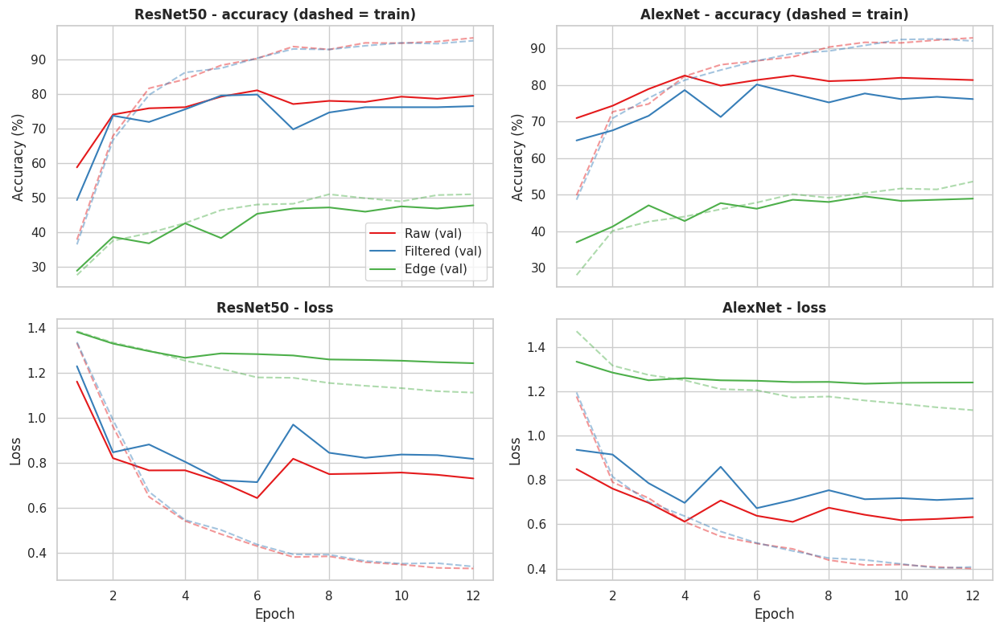

In [21]:
cnn_runs = {k: r for k, r in RES.items() if r["family"] == "cnn" and r["seed"] == SEEDS[0]}
fig, axes = plt.subplots(2, len(CNN_ARCHS), figsize=(6.3 * len(CNN_ARCHS), 8), squeeze=False, sharex=True)
pal = dict(zip(REPS, sns.color_palette("Set1", 3)))
for j, arch in enumerate(CNN_ARCHS):
    for rep in REPS:
        r = cnn_runs.get(f"{arch}|{rep}|{SEEDS[0]}")
        if r is None: continue
        h = r["history"]; ep = range(1, len(h["val_acc"]) + 1)
        axes[0, j].plot(ep, h["val_acc"], color=pal[rep], label=f"{rep} (val)")
        axes[0, j].plot(ep, h["train_acc"], "--", color=pal[rep], alpha=.45)
        axes[1, j].plot(ep, h["val_loss"], color=pal[rep], label=f"{rep} (val)")
        axes[1, j].plot(ep, h["train_loss"], "--", color=pal[rep], alpha=.45)
    axes[0, j].set_title(f"{arch} - accuracy (dashed = train)", fontweight="bold"); axes[0, j].set_ylabel("Accuracy (%)")
    axes[1, j].set_title(f"{arch} - loss", fontweight="bold"); axes[1, j].set_ylabel("Loss"); axes[1, j].set_xlabel("Epoch")
axes[0, 0].legend()
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig8_learning_curves.png", dpi=150); plt.show()

## 9. Task 6 — Visual comparison for the best-performing model

*Best-performing model* = highest **mean macro-F1 across the three input representations** (so a model that only wins on one set is not favoured).

Mean macro-F1 across Raw / Filtered / Edge:
 Model
CNN Model 2 (AlexNet)     55.21
CNN Model 1 (ResNet50)    54.61
SVM                       50.26
Random Forest             43.85
KNN                       37.59

>>> Best-performing model: CNN Model 2 (AlexNet)


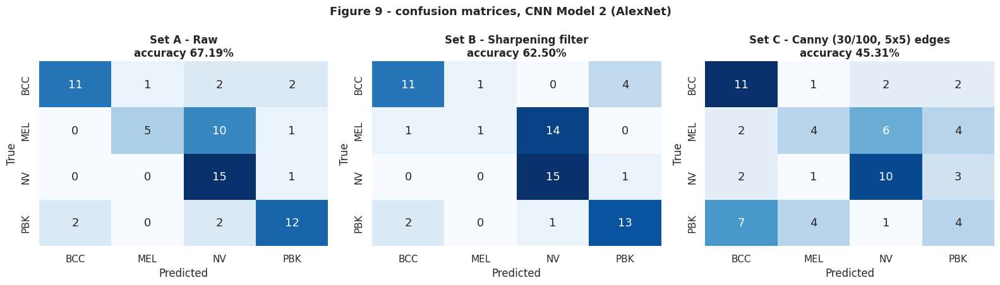

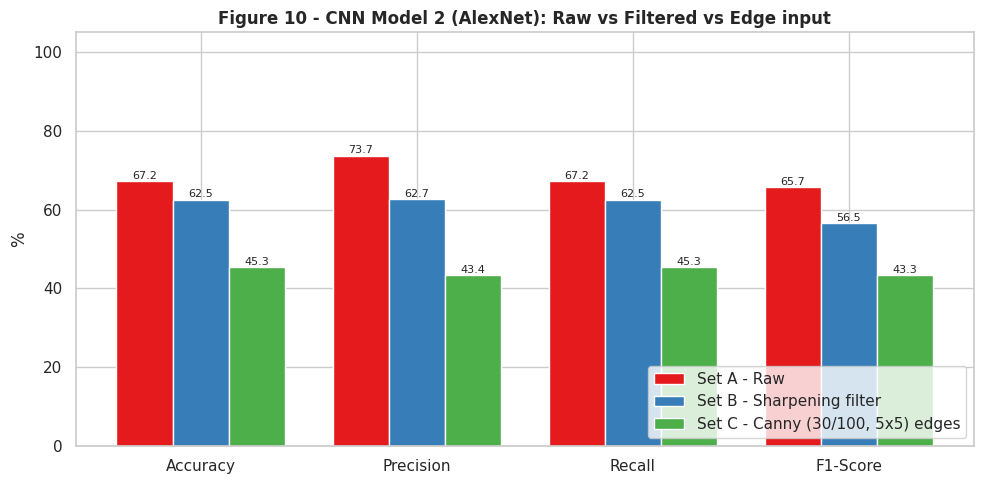

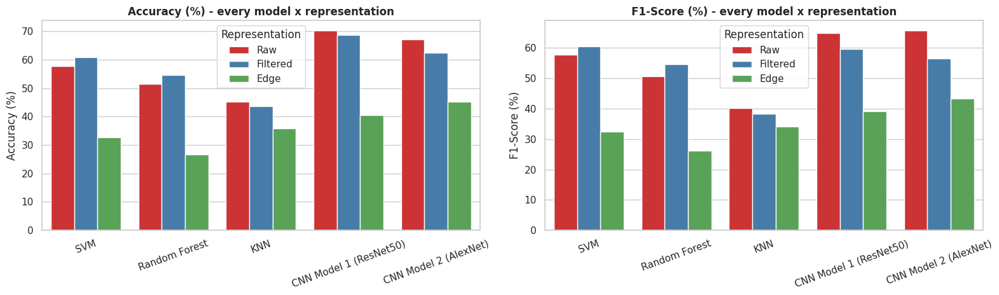

Model,Representation,dAccuracy (pp),dF1 (pp)
SVM,Filtered,3.120000,2.830000
SVM,Edge,-25.000000,-25.410000
Random Forest,Filtered,3.120000,3.860000
Random Forest,Edge,-25.000000,-24.590000
KNN,Filtered,-1.560000,-1.720000
KNN,Edge,-9.380000,-5.960000
CNN Model 1 (ResNet50),Filtered,-1.560000,-5.240000
CNN Model 1 (ResNet50),Edge,-29.690000,-25.680000
CNN Model 2 (AlexNet),Filtered,-4.690000,-9.210000
CNN Model 2 (AlexNet),Edge,-21.880000,-22.400000



Edge images vs raw images (accuracy): 5 of 5 models got WORSE, 0 got better; mean change -22.19 pp (macro-F1 -20.81 pp).


In [22]:
score = T3B.groupby("Model")["F1-Score (%)"].mean()
BEST_LABEL = score.idxmax()
BEST_KEY = dict(MODEL_ROWS)[BEST_LABEL]
print("Mean macro-F1 across Raw / Filtered / Edge:\n", score.round(2).sort_values(ascending=False).to_string())
print(f"\n>>> Best-performing model: {BEST_LABEL}")

# ---------- confusion matrices ----------
fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
for ax, rep in zip(axes, REPS):
    rs = runs_of(BEST_KEY, rep)
    cm = sum(confusion_matrix(r["y_true"], r["y_pred"], labels=list(range(NUM_CLASSES))) for r in rs)
    acc = mean_of(BEST_KEY, rep, lambda r: r["test"]["accuracy"])
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax, annot_kws={"size": 13},
                xticklabels=SHORT_NAMES, yticklabels=SHORT_NAMES)
    ax.set_title(f"{REP_LABEL[rep]}\naccuracy {acc:.2f}%", fontweight="bold"); ax.set_xlabel("Predicted"); ax.set_ylabel("True")
plt.suptitle(f"Figure 9 - confusion matrices, {BEST_LABEL}" + (f" (summed over {len(SEEDS)} seeds)" if len(SEEDS) > 1 else ""),
             fontsize=13, fontweight="bold")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig9_confusion_matrices.png", dpi=150); plt.show()

# ---------- bar chart: accuracy / precision / recall / F1 ----------
metric_cols = ["Accuracy (%)", "Precision (%)", "Recall (%)", "F1-Score (%)"]
sub = T3B[T3B.Model == BEST_LABEL].set_index("Representation").loc[REPS, metric_cols]
x = np.arange(len(metric_cols)); w = 0.26
fig, ax = plt.subplots(figsize=(10, 5))
for i, rep in enumerate(REPS):
    bars = ax.bar(x + (i - 1) * w, sub.loc[rep].values, w, label=REP_LABEL[rep], color=pal[rep])
    for b in bars: ax.text(b.get_x() + b.get_width() / 2, b.get_height() + 0.6, f"{b.get_height():.1f}", ha="center", fontsize=8)
ax.set_xticks(x); ax.set_xticklabels([c.replace(" (%)", "") for c in metric_cols])
ax.set_ylabel("%"); ax.set_ylim(0, 105); ax.legend(loc="lower right")
ax.set_title(f"Figure 10 - {BEST_LABEL}: Raw vs Filtered vs Edge input", fontweight="bold")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig10_metric_bars.png", dpi=150); plt.show()

# ---------- all models: accuracy and F1 by representation ----------
fig, axes = plt.subplots(1, 2, figsize=(16, 4.8))
for ax, col in zip(axes, ["Accuracy (%)", "F1-Score (%)"]):
    sns.barplot(data=T3B, x="Model", y=col, hue="Representation", hue_order=REPS, palette=pal, ax=ax)
    ax.set_title(f"{col} - every model x representation", fontweight="bold"); ax.tick_params(axis="x", rotation=20); ax.set_xlabel("")
plt.tight_layout(); plt.savefig(f"{RESULT_DIR}/fig11_all_models.png", dpi=150); plt.show()

# ---------- change relative to raw ----------
dl = []
for label, key in MODEL_ROWS:
    raw = T3B[(T3B.Model == label) & (T3B.Representation == "Raw")].iloc[0]
    for rep in ["Filtered", "Edge"]:
        r = T3B[(T3B.Model == label) & (T3B.Representation == rep)].iloc[0]
        dl.append({"Model": label, "Representation": rep, "dAccuracy (pp)": r["Accuracy (%)"] - raw["Accuracy (%)"],
                   "dF1 (pp)": r["F1-Score (%)"] - raw["F1-Score (%)"]})
DELTA = pd.DataFrame(dl)
DELTA.round(2).to_csv(f"{RESULT_DIR}/delta_vs_raw.csv", index=False)
display(DELTA.round(2).style.hide(axis="index").background_gradient(subset=["dAccuracy (pp)", "dF1 (pp)"], cmap="RdYlGn", vmin=-20, vmax=20))

e_vs_r = DELTA[DELTA.Representation == "Edge"]
print(f"\nEdge images vs raw images (accuracy): {(e_vs_r['dAccuracy (pp)'] < 0).sum()} of {len(e_vs_r)} models got WORSE, "
      f"{(e_vs_r['dAccuracy (pp)'] > 0).sum()} got better; mean change {e_vs_r['dAccuracy (pp)'].mean():+.2f} pp "
      f"(macro-F1 {e_vs_r['dF1 (pp)'].mean():+.2f} pp).")